Three dependent variables, `left`, `personal_left` and `satisfaction_level` <BR/>
This Jupyter notebook built models to predict `left`
* Decision Tree
* Random Forest
* XGBoost

## Imports

*   Import packages
*   Load dataset

### Import packages

In [1]:
# Import packages
import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import PredefinedSplit
from sklearn.ensemble import RandomForestClassifier

from xgboost import XGBClassifier
from xgboost import plot_importance

from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree

from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score,f1_score, make_scorer, fbeta_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import roc_curve, roc_auc_score

import pickle
import math

import statsmodels.api as sm
from scipy import stats
from sklearn import preprocessing


#test
from scipy.stats import kruskal, friedmanchisquare
from scipy.stats import ks_2samp
from scipy.stats import levene
from scipy.stats import mannwhitneyu
from statsmodels.stats.proportion import proportions_ztest

In [2]:
pd.set_option('display.max_columns', None)

input_file_path='/kaggle/input/salifort-motors-employee-leave-prediction-eda/'

import warnings
warnings.filterwarnings('ignore')

### Load dataset

**DataFrame Used in this Lab**

* df0: the original dataset, only changed column names
* df_drop: deleted duplicated rows in df0

In [3]:
# Load dataset into a dataframe
# data after cleaning
df_drop = pd.read_csv(input_file_path+"employee_data_clean.csv")

# Display first few rows of the dataframe
df_drop.head(10)

,satisfaction_level,last_evaluation,number_project,average_monthly_hours,time_spend_company,work_accident,left,promotion_last_5years,department,salary,salary_encoding,emp_type,evaluation_range,average_monthly_hours_range,time_spend_company_range,left_group,left_type,personal_left
0,0.38,0.53,2,157,3,0,1,0,sales,low,0,part time,"(0.4,0.6]","(125,160]",3,group1,company,0
1,0.80,0.86,5,262,6,0,1,0,sales,medium,1,full time,"(0.8,1]","(240,280]",>=6,group3,company,0
2,0.11,0.88,7,272,4,0,1,0,sales,medium,1,full time,"(0.8,1]","(240,280]",4,group2,company,0
3,0.72,0.87,5,223,5,0,1,0,sales,low,0,full time,"(0.8,1]","(200,240]",5,group3,company,0
4,0.37,0.52,2,159,3,0,1,0,sales,low,0,part time,"(0.4,0.6]","(125,160]",3,group1,company,0
5,0.41,0.50,2,153,3,0,1,0,sales,low,0,part time,"(0.4,0.6]","(125,160]",3,group1,company,0
6,0.10,0.77,6,247,4,0,1,0,sales,low,0,full time,"(0.6,0.8]","(240,280]",4,group2,company,0
7,0.92,0.85,5,259,5,0,1,0,sales,low,0,full time,"(0.8,1]","(240,280]",5,group3,company,0
8,0.89,1.00,5,224,5,0,1,0,sales,low,0,full time,"(0.8,1]","(200,240]",5,group3,company,0
9,0.42,0.53,2,142,3,0,1,0,sales,low,0,part time,"(0.4,0.6]","(125,160]",3,group1,company,0


In [4]:
df_drop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11991 entries, 0 to 11990
Data columns (total 18 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   satisfaction_level           11991 non-null  float64
 1   last_evaluation              11991 non-null  float64
 2   number_project               11991 non-null  int64  
 3   average_monthly_hours        11991 non-null  int64  
 4   time_spend_company           11991 non-null  int64  
 5   work_accident                11991 non-null  int64  
 6   left                         11991 non-null  int64  
 7   promotion_last_5years        11991 non-null  int64  
 8   department                   11991 non-null  object 
 9   salary                       11991 non-null  object 
 10  salary_encoding              11991 non-null  int64  
 11  emp_type                     11991 non-null  object 
 12  evaluation_range             11991 non-null  object 
 13  average_monthly_

In [5]:
###########################################
#Encode salary
###########################################
# Create categorical designations
salary_order = ['low', 'medium', 'high']
# Encode `df_drop` column as categoricals 
df_drop['salary'] = pd.Categorical(df_drop['salary'], categories=salary_order, ordered=True)

df_drop['salary_encoding']=df_drop['salary'].cat.codes

df_drop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11991 entries, 0 to 11990
Data columns (total 18 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   satisfaction_level           11991 non-null  float64 
 1   last_evaluation              11991 non-null  float64 
 2   number_project               11991 non-null  int64   
 3   average_monthly_hours        11991 non-null  int64   
 4   time_spend_company           11991 non-null  int64   
 5   work_accident                11991 non-null  int64   
 6   left                         11991 non-null  int64   
 7   promotion_last_5years        11991 non-null  int64   
 8   department                   11991 non-null  object  
 9   salary                       11991 non-null  category
 10  salary_encoding              11991 non-null  int8    
 11  emp_type                     11991 non-null  object  
 12  evaluation_range             11991 non-null  object  
 13  a

### Insights

### Questions of Model building

>Do you notice anything odd?

Yes, 
when use `number_project` it seemed to be very important. In real world experience projects have different scale/difficllty, number_project may not reflect employee's skill/experience. I checked the dataset and found there are patterns(groups), most employees seemed to have very close evaluation score and satisfaction score, groups had very clear boundary, not randomly spread, it might due to lay off(the target employees had many similarities) or this dataset is not real world dataset or this dataset is not a random sample.


>Which independent variables did you choose for the model and why?

average_monthly_hours, time_spend_company, (last_evaluation), (number_project),(work_accident),promotion_last_5years,(department),salary,emp_type 
Variables without () are easy to get data and could be compared across organizations.
Variables with () are not easy to get, may have different standards in different organizations, may not be good to compare across organizations.

>Are each of the assumptions met?
    
Not sure independent assumptions

>How well does your model fit the data?
    
When predicting employees left(include company and personal), a little over fitting.

>Can you improve it? Is there anything you would change about the model?
    
Yes, I will try to add restriction to leaf or reduce max_depth. I want to know the results of personal leave(assume the patterns in this dataset means layoff)

>What resources do you find yourself using as you complete this stage? (Make sure to include the links.)

* [Random Oversampling and Undersampling for Imbalanced Classification](https://machinelearningmastery.com/random-oversampling-and-undersampling-for-imbalanced-classification/)
* [Balancing Imbalanced Data: Undersampling and Oversampling Techniques in Python](https://medium.com/@daniele.santiago/balancing-imbalanced-data-undersampling-and-oversampling-techniques-in-python-7c5378282290)
* [SMOTE for Imbalanced Classification with Python](https://machinelearningmastery.com/smote-oversampling-for-imbalanced-classification/)
* [imblearn.over_sampling.SMOTE](https://imbalanced-learn.org/stable/references/generated/imblearn.over_sampling.SMOTE.html)
* [How to do cross-validation when upsampling data](https://kiwidamien.github.io/how-to-do-cross-validation-when-upsampling-data.html)
* [Machine learning assumptions](https://medium.com/swlh/its-all-about-assumptions-pros-cons-497783cfed2d)
* [What Are the Assumptions of XGBoost?](https://www.kdnuggets.com/2022/08/assumptions-xgboost.html)

>Do you have any ethical considerations in this stage?

Yes, which features should I use and which evaluation metrics should I use.
* The proportion of left=1 was 16.6%, the proportion of personal_left was 1.6%, both dependent varaibles were imbalanced, `accuracy` was not a good metric. False positive(Model predicts someone will leave but they actually won’t leave) may lead the company to spend money and time trying to prevent employees from leaving. In some situation the employee might lose chance to challenge important projects/promotion since their manager or leader think they might leave. False negative(Model predicts someone won’t leave but they actual will leave), the company will fail to prevent employee from leaving, need to hire new employees, train them. I would like to balance false positive and false negative, use f1 as an evaluation metric.
* Every feature has its limitations, please refer the bellowing tables

**Model Features**

|Feature|Pros |Cons |Limit|
|:-     |:-   |:-   |:-   |
|satisfaction_level|* Improve prediction results|* Extra cost to take survey<BR/>* Increase employees workload<BR/>* Missing value(Not all employees will response)<BR/>|* May not comparable and stable if the company has diverse employees and the character of employees change a lot(e.g. wide range of age, education, gender, country)|
|last_evaluation|* Improve prediction results<BR/>* Possible to extract data from existing system, less cost and workload <BR/>* Data will be more complete and reliable if extract from inner system|* Data update frequency rely on company evalution frequency(generally half of a year), difficult to detect change in short period.|* May not comparable and stable if the company has different evaluation standard/guideline or evaluation standard change a lot|
|average_monthly_hours|* Improve prediction results<BR/>* Possible to extract data from existing system, less cost and workload <BR/>* Data will be more complete and reliable if extract from inner system<BR/>* Possible to detect change in short period(e.g. monthly, quarterly)|- |* May not comparable if the company has different standard work hour or overtime limit(e.g. employee type:full time/part time, position:staff/management/tech) and dataset lack of these features<BR/>* May not comparable/reliable if the company has different tracking system.|
|time_spend_company|* Improve prediction results<BR/>* Possible to extract data from existing system, less cost and workload <BR/>* Data will be more complete and reliable if extract from inner system<BR/>* Stable and comparable|* Not sensitive, measured by year|- |
|promotion_last_5years|* Improve prediction results<BR/>* Possible to extract data from existing system, less cost and workload <BR/>* Data will be more complete and reliable if extract from inner system|* Data update frequency rely on company evalution frequency(generally half of a year or yearly), not sensitive|* May not comparable and stable if the company has different promotion standard/guideline or promotion standard change a lot and this dataset doesn't include these features.|
|department|* Improve prediction results<BR/>* Possible to extract data from existing system, less cost and workload<BR/> * Data will be more complete and reliable if extract from inner system|* Not comparable|* May not stable if the company has many subsidiaries(and need to predict all employees) or department change a lot|
|number_project|* Improve prediction results|* May need extra cost to take survey to get data<BR/>* May increase employees workload if take survey<BR/>* May have missing value(Not all employees will response)<BR/>* Less reliable<BR/>* Not comparable(Projects has different scales, difficulties, roles)|- |
|work_accident|* Improve prediction results|* May need extra cost to take survey to get data<BR/>* May increase employees workload if take survey<BR/>* May have missing value(Not all employees will response)<BR/>* Less reliable<BR/>* Not comparable(Accident has different type, level, reason, impact)|- |
|salary|* Improve prediction results<BR/>* Possible to extract data from existing system, less cost and workload <BR/>* Data will be more complete and reliable if extract from inner system|* Data update frequency rely on company evalution frequency(generally half of a year), difficult to detect change in short period.<BR/>* Less sensitive, categorical data, could not detect minior change|* May not stable if the company has branches across country/region or economy or goods price change a lot.|
|emp_type|* Improve prediction results<BR/>* Less cost and workload, calculated from existing feature|* Less reliable, may differ from actual employment type<BR/>* Not comparable|* Not correct if work hour boundary of part time/full time is not 160 hours or this dataset had employees who took long time leave or this dataset had other employment type.<BR/>* Not stable if standard work hour of different employment type change a lot.|

**Note:** Some features might be possible to extract from inner systems. Before using these data we need to get approval.

|Feature|Assoication|Who input|IfStable|IfComparable|Update Frequency|Get data Frequency| Use or not|
|:-|:-|:-|:-|:-|:-|:-|:-|
|satisfaction_level|How they feel about work/company|Employee|Not stable|Relatively Comparable|frequency as survey|frequency as survey|Yes(with condition)|
|last_evaluation|contribution/recognization/salary/promotion/job title|Employee/Related department|Relatively Stable|Relatively Comparable|quarterly/half year/yearly|daily/pre-defined period|Yes(with condition)|
|number_project|contribution|Employee|Relatively Stable|Not Comparable|frequency as survey|frequency as survey|No|
|average_monthly_hours|satisfaction/health/contribution/efficiency/workload|Employee/System|Stable|Relatively Comparable|monthly|monthly/pre-defined period|Yes(with condition)|
|time_spend_company|satisfaction/loyalty/skill/career plan|System|Stable|Comparable|yearly|monthly/pre-defined period|Yes|
|work_accident|skill/honesty/contribution/difficulty/sense of responsibility|Employee/Supervision department|Relatively Stable|Not Comparable|Unkown(frequency as survey)|Unkown(frequency as survey)|No|
|promotion_last_5years|contribution/recognization/salary/job title|Employee/Related department|Stable|Relatively Comparable|quarterly/half year/yearly|daily/pre-defined period|Yes(with condition)|
|department|responsibility/culture/position in the company/sense of accomplishment/workload/evalution point/career path|System/Company|Relatively Stable|Not Comparable|Unkown|daily/pre-defined period|Yes(with condition)|
|salary|contribution/recognization/promotion/job title|System|Relatively Stable|Comparable|quarterly/half year/yearly|daily/pre-defined period|Yes(with condition)|
|emp_type|responsibility/salary/promotion/work hour/career path|System|Relatively Stable|Not Comparable|Unkown|daily/pre-defined period|Yes(with condition)|




## Build Models

* Decision Tree
* Random Forest
* XGBoost

In [6]:

target_columns=[
       'satisfaction_level', 'last_evaluation', 'number_project',
       'average_monthly_hours', 'time_spend_company', 'work_accident', 'left',
       'promotion_last_5years', 'department', 'salary','emp_type','personal_left'
               ]
df_sample=df_drop[target_columns]

In [7]:
#confirm proportion of left employees
display(df_sample['left'].value_counts(normalize=True))
display(df_sample['personal_left'].value_counts(normalize=True))

left
0    0.833959
1    0.166041
Name: proportion, dtype: float64

personal_left
0    0.984071
1    0.015929
Name: proportion, dtype: float64

In [8]:
######################################################
#Dummy encoding
######################################################
df_dummy=df_sample.copy()

#confirm after update
df_dummy.info()

#**************************#
#Confirm column names
#**************************#
#check object type and see if any object columns+'_' exists in other columns(e.g. RatecodeID and RatecodeID_XXXX NG)
#get columns which could be convert into dummy/indicator variables
trans_dummy_variables=list(df_dummy.select_dtypes(include=[object,'category']).columns)

#get columns which could not be convert into dummy/indicator variables
not_trans_dummy_variables=list(df_dummy.select_dtypes(exclude=[object,'category']).columns)

#after dummy encoding, their column name would be XXXX->XXXX_YYYY1,XXXX_YYYY2....
#get_fit_features will not work correctly if both XXXX and XXXX_?(Not columns after dummy encoding)(? means any word) exist
if len(trans_dummy_variables)+len(not_trans_dummy_variables)!=len(df_dummy.columns):
    raise Exception("Data type incorrect, please check again")
if not (set(trans_dummy_variables).union(set(not_trans_dummy_variables))==set(df_dummy.columns)):
    raise Exception("Data type incorrect, please check again")
print(trans_dummy_variables)
dummy_prefix_sep='_dummy_'
duplicate_flg=False

for dummy_col in trans_dummy_variables:
    for not_trans_col in not_trans_dummy_variables:
        if (dummy_col+dummy_prefix_sep) in not_trans_col:
            duplicate_flg=True
if duplicate_flg==True:
    raise Exception("Dummy variable columns duplicated with others, please update column names")


# Convert categoricals to binary
df_dummy=pd.get_dummies(df_dummy,columns=['department', 'salary','emp_type'], prefix_sep=dummy_prefix_sep, dtype=bool, prefix=None)
df_dummy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11991 entries, 0 to 11990
Data columns (total 12 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   satisfaction_level     11991 non-null  float64 
 1   last_evaluation        11991 non-null  float64 
 2   number_project         11991 non-null  int64   
 3   average_monthly_hours  11991 non-null  int64   
 4   time_spend_company     11991 non-null  int64   
 5   work_accident          11991 non-null  int64   
 6   left                   11991 non-null  int64   
 7   promotion_last_5years  11991 non-null  int64   
 8   department             11991 non-null  object  
 9   salary                 11991 non-null  category
 10  emp_type               11991 non-null  object  
 11  personal_left          11991 non-null  int64   
dtypes: category(1), float64(2), int64(7), object(2)
memory usage: 1.0+ MB
['department', 'salary', 'emp_type']
<class 'pandas.core.frame.DataFrame'>

In [9]:
######################################################
#Label encoding
######################################################
df_label=df_sample.copy()

#confirm after update
df_label.info()

df_label['salary']=df_label['salary'].cat.codes

#encode department
label_encoder = preprocessing.LabelEncoder()
df_label['department']= label_encoder.fit_transform(df_label['department'])

#encode emp_type
map_emp_type={
    'part time':0,
    'full time':1
}
df_label['emp_type']= df_label['emp_type'].map(map_emp_type)

#confirm after update
df_label.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11991 entries, 0 to 11990
Data columns (total 12 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   satisfaction_level     11991 non-null  float64 
 1   last_evaluation        11991 non-null  float64 
 2   number_project         11991 non-null  int64   
 3   average_monthly_hours  11991 non-null  int64   
 4   time_spend_company     11991 non-null  int64   
 5   work_accident          11991 non-null  int64   
 6   left                   11991 non-null  int64   
 7   promotion_last_5years  11991 non-null  int64   
 8   department             11991 non-null  object  
 9   salary                 11991 non-null  category
 10  emp_type               11991 non-null  object  
 11  personal_left          11991 non-null  int64   
dtypes: category(1), float64(2), int64(7), object(2)
memory usage: 1.0+ MB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11991 entries, 0 to 1199

#### **Split the data**

In [10]:
RANDOM_STATE=0
depedent_variables=['left','personal_left']
################################################
#Use dummy encoding dataset
################################################
y_dummy_list=[]
for depedent_var in depedent_variables:
    y_dummy=df_dummy[depedent_var]
    y_dummy_list.append(y_dummy)

X_dummy = df_dummy.copy()
X_dummy = X_dummy.drop(depedent_variables, axis = 1)


#*****************************************#
# Split into train and test sets
#*****************************************#
X_dummy_train_val_list=[]
y_dummy_train_val_list=[]
X_dummy_test_list=[]
y_dummy_test_list=[]
X_dummy_train_list=[]
y_dummy_train_list=[]
X_dummy_val_list=[]
y_dummy_val_list=[]

for y_dummy in y_dummy_list:
    X_dummy_train_val, X_dummy_test, y_dummy_train_val, y_dummy_test = train_test_split(X_dummy, y_dummy, 
                                                        test_size=0.25, stratify=y_dummy, 
                                                        random_state=RANDOM_STATE)
    
    # Split train into train and validation sets
    X_dummy_train, X_dummy_val, y_dummy_train, y_dummy_val = train_test_split(X_dummy_train_val, y_dummy_train_val, 
                                                      test_size=0.2, stratify=y_dummy_train_val, 
                                                      random_state=RANDOM_STATE)
    X_dummy_train_val_list.append(X_dummy_train_val)
    y_dummy_train_val_list.append(y_dummy_train_val)
    X_dummy_test_list.append(X_dummy_test)
    y_dummy_test_list.append(y_dummy_test)
    X_dummy_train_list.append(X_dummy_train)
    y_dummy_train_list.append(y_dummy_train)
    X_dummy_val_list.append(X_dummy_val)
    y_dummy_val_list.append(y_dummy_val)

################################################
#Use Label encoding dataset
################################################
y_label_list=[]
for depedent_var in depedent_variables:
    y_label=df_label[depedent_var]
    y_label_list.append(y_label)

X_label = df_label.copy()
X_label = X_label.drop(depedent_variables, axis = 1)

#*****************************************#
# Split into train and test sets
#*****************************************#
X_label_train_val_list=[]
y_label_train_val_list=[]
X_label_test_list=[]
y_label_test_list=[]
X_label_train_list=[]
y_label_train_list=[]
X_label_val_list=[]
y_label_val_list=[]

for y_label in y_label_list:
    X_label_train_val, X_label_test, y_label_train_val, y_label_test = train_test_split(X_label, y_label, 
                                                        test_size=0.25, stratify=y_label, 
                                                        random_state=RANDOM_STATE)
    
    # Split train into train and validation sets
    X_label_train, X_label_val, y_label_train, y_label_val = train_test_split(X_label_train_val, y_label_train_val, 
                                                      test_size=0.2, stratify=y_label_train_val, 
                                                      random_state=RANDOM_STATE)
    X_label_train_val_list.append(X_label_train_val)
    y_label_train_val_list.append(y_label_train_val)
    X_label_test_list.append(X_label_test)
    y_label_test_list.append(y_label_test)
    X_label_train_list.append(X_label_train)
    y_label_train_list.append(y_label_train)
    X_label_val_list.append(X_label_val)
    y_label_val_list.append(y_label_val)

In [11]:
select_col_list=[
    #Index 1
    ['satisfaction_level', 'last_evaluation', 'number_project',
       'average_monthly_hours', 'time_spend_company', 'work_accident',
       'promotion_last_5years', 'department', 'salary'],
    #Index 2
    ['last_evaluation', 'number_project',
       'average_monthly_hours', 'time_spend_company', 'work_accident',
       'promotion_last_5years', 'department', 'salary'],
    #Index 3 (number_project was associated with work hour, time_spend_company)
    ['last_evaluation', 
       'average_monthly_hours', 'time_spend_company', 'work_accident',
       'promotion_last_5years', 'department', 'salary'],
    #Index 4 (add employment type)
    ['last_evaluation', 
       'average_monthly_hours', 'time_spend_company', 'work_accident',
       'promotion_last_5years', 'department', 'salary', 'emp_type'],
    #Index 5 
    ['average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'salary', 'emp_type'],
    #Index 6
    ['last_evaluation',
       'average_monthly_hours', 'time_spend_company', 
       'promotion_last_5years', 'department', 'salary'],
    #Index 7
    ['last_evaluation',
       'average_monthly_hours', 'time_spend_company', 
       'promotion_last_5years', 'department', 'salary', 'emp_type'],
    #Index 8
    ['last_evaluation',
       'average_monthly_hours', 'time_spend_company', 
       'promotion_last_5years', 'salary'],
    #Index 9
    ['last_evaluation',
       'average_monthly_hours', 'time_spend_company', 
       'promotion_last_5years', 'salary', 'emp_type'],
]

In [12]:
import pickle 

# Define a path to the folder where you want to save the model
path = '/kaggle/working/'

path_rf = path+'rf_pickle/'
path_xgb = path+'xgb_pickle/'
path_dt = path+'dt_pickle/'
path_image=path+'image/'

import os
def create_dir(dir_path):
    # Create the directory
    try:
        os.mkdir(dir_path)
        print(f"Directory '{dir_path}' created successfully.")
    except FileExistsError:
        print(f"Directory '{dir_path}' already exists.")
    except PermissionError:
        print(f"Permission denied: Unable to create '{dir_path}'.")
    except Exception as e:
        print(f"An error occurred: {e}")

def write_pickle(path, model_object, save_name:str):
    '''
    save_name is a string.
    '''
    with open(path + save_name + '.pickle', 'wb') as to_write:
        pickle.dump(model_object, to_write)

def read_pickle(path, saved_model_name:str):
    '''
    saved_model_name is a string.
    '''
    with open(path + saved_model_name + '.pickle', 'rb') as to_read:
        model = pickle.load(to_read)
        #f.read()
        #print(pickle.load(to_read))
        #model = pickle.load(to_read.read())
        return model


import re
def find_number(text, c):
    temp = re.findall(r'%s(\d+)' % c, text)
    res = list(map(int, temp))
    return res


def chk_dummy_col(select_cols,dummy_colname_list,dummy_prefix_sep):
    for select_col in select_cols:
        select_col_exist_flg=False
        for dummy_col in dummy_colname_list:
            if select_col in dummy_col:
                select_col_exist_flg=True
            elif (select_col+dummy_prefix_sep) in dummy_col:
                #dummy column
                select_col_exist_flg=True
        if select_col_exist_flg==False:
            raise Exception(f"{select_col} doesn't exist")
            
def chk_if_dummy_encoding(select_cols,dummy_colname_list,dummy_prefix_sep):
    select_length=len(select_cols)
    dummy_length=len(dummy_colname_list)
    i=0
    chk_result=False
    while (i < select_length)&(chk_result==False):
        select_col=select_cols[i]
        dummy_jump_flg=False
        select_col_exist_flg=False
        j=0
        while (j<dummy_length)&(dummy_jump_flg==False):
            dummy_col=dummy_colname_list[j]
            if (select_col+dummy_prefix_sep) in dummy_col:
                dummy_jump_flg=True
            j=j+1
        if dummy_jump_flg==True:
            chk_result=True
        i=i+1
    if chk_result==True:
        chk_dummy_col(select_cols,dummy_colname_list,dummy_prefix_sep)
    return chk_result

    
def get_dummy_colnames(select_cols,dummy_colname_list):
    """
    select_cols(list): original columns
    dummy_colname_list(list): column list after dummy encoding
    """
    #separator/delimiter to use in dummy encoding
    dummy_prefix_sep='_dummy_'
    res_dummy_colnames=list(dummy_colname_list)
    #check setting
    if chk_if_dummy_encoding(select_cols,dummy_colname_list,dummy_prefix_sep)==False:
        raise Exception("Not dummy encoding")
        
    for dummy_col in dummy_colname_list:
        if dummy_col not in select_cols:
            jump_flg=False
            for col in select_cols:
                if (col+dummy_prefix_sep) in dummy_col:
                    jump_flg=True
            if jump_flg==False:
                res_dummy_colnames.remove(dummy_col) 
    return res_dummy_colnames




def get_fit_features(select_cols, transformed_cols, encoding_type:str,exclude_target_var=True):
    """
    Get fitting feature list
        select_cols(list): original columns(before encoding)
        transformed_cols(list): transformed columns(after encoding)
        encoding_type(string): dummy or label encoding type
        exclude_target_var(Bool): exclude target variable or not
    """
    
    #target_variable_list=['left']
    target_variable_list=depedent_variables
    label_encoding_drop_list=['day','month']
    valid_encoding=['dummy','label']
    if encoding_type not in valid_encoding:
        raise Exception("Only 'dummy' or 'label' allowed")
    select_features=select_cols.copy()
    if exclude_target_var==True:
        #drop target variables
        for target_var in target_variable_list:
            if target_var in select_features:
                select_features.remove(target_var)

    #if label encoding, drop non-number columns
    if encoding_type=='label':
        for drop_col in label_encoding_drop_list:
            if drop_col in select_features:
                select_features.remove(drop_col)
        for select_feature in select_features:
            if select_feature not in transformed_cols:
                raise Exception("select_cols, transformed_cols ,encoding_type unmatch")
        res_feature_list=select_features
    else:
        res_feature_list=get_dummy_colnames(select_features,transformed_cols)
    return res_feature_list



import os.path
def check_picklefile_exists(path, saved_model_name:str):
    """
    Check if pickle exists
    """
    fname=path + saved_model_name + '.pickle'
    if os.path.isfile(fname)==True:
        return True
    else:
        return False




def confusion_matrix_plot(model, x_data, y_data,title='Confusion matrix'):
    '''
    Accepts as argument model object, X data (test or validate), and y data (test or validate). 
    Returns a plot of confusion matrix for predictions on y data.
    ''' 
  
    model_pred = model.predict(x_data)
    cm = confusion_matrix(y_data, model_pred, labels=model.classes_)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                             display_labels=model.classes_)
  
    disp.plot(values_format='')  # `values_format=''` suppresses scientific notation
    plt.title(title)
    plt.show()
    
def confusion_matrix_plot_ax(model, x_data, y_data,ax,title='Confusion matrix'):
    '''
    Accepts as argument model object, X data (test or validate), and y data (test or validate). 
    Returns a plot of confusion matrix for predictions on y data.
    ''' 
  
    model_pred = model.predict(x_data)
    cm = confusion_matrix(y_data, model_pred, labels=model.classes_)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                             display_labels=model.classes_)
  
    disp.plot(values_format='',ax=ax)  # `values_format=''` suppresses scientific notation
    ax.set_title(title)



#https://scikit-learn.org/stable/modules/generated/sklearn.metrics.fbeta_score.html
def get_test_scores(model_name:str, preds, y_test_data,preds_prob):
    '''
    Generate a table of test scores.

    In:
    model_name (string): Your choice: how the model will be named in the output table
    preds: numpy array of test predictions
    y_test_data: numpy array of y_test data

    Out:
    table: a pandas df of precision, recall, f1, and accuracy scores for your model
    '''
    accuracy = accuracy_score(y_test_data, preds)
    precision = precision_score(y_test_data, preds)
    recall = recall_score(y_test_data, preds)
    f1 = f1_score(y_test_data, preds)
    

    # Compute the ROC AUC score
    #https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_auc_score.html
    roc_auc = roc_auc_score(y_test_data, preds_prob) 

    table = pd.DataFrame({'model': [model_name],
                        'precision': [precision],
                        'recall': [recall],
                        'F1': [f1],
                        'accuracy': [accuracy],
                        'ROC_AUC': [roc_auc],
                        })

    return table

import datetime

def compute_run_duration(run_start_time,run_end_time):
    run_duration=run_end_time-run_start_time
    run_minutes=math.floor(run_duration.total_seconds()/60)
    run_seconds=math.floor(run_duration.total_seconds()-run_minutes*60)
    return f'{run_minutes} min {run_seconds} s'


def chk_encoding_type(encoding_type):
    valid_encoding=['dummy','label']
    if type(encoding_type) == str:
        if encoding_type not in valid_encoding:
            raise Exception("Only 'dummy' or 'label' allowed")
    elif type(encoding_type) == list:
        if (set(valid_encoding)==set(encoding_type)) &(len(valid_encoding)==len(encoding_type)) == False:
            raise Exception("Only 'dummy' and 'label' two element list are allowed")
    
def rf_grid_fit(target_index:int,feature_index:int, hyp_index:int, gs_index:int, encoding_type:str,rf_classifier, cv=5,refit='f1',score=['accuracy', 'precision', 'recall', 'f1']):
    """
        fit gridsearch
        Input:
            target_index(int): indexof target variable list, strat from 1
            feature_index(int): index of feature list, start from 1
            hyp_index(int): index of hyperparameters list, start from 1
            gs_index(int): grid search index if want to try different cv or refit, start from 1
            encoding_type(str): data encoding type. 'dummy' or 'label'
            rf_classifier(RandomForestClassifier):RandomForestClassifier
            cv(int):cross-validation generator or an iterable
            refit: Refit an estimator using the best found parameters on the whole dataset
    """
    if (target_index<1) | (feature_index<1) | (hyp_index<1)| (gs_index<1):
        raise Exception("Index start from 1")
    
    feature_len=len(select_col_list)
    target_len=len(depedent_variables)
    # check feature list index range
    if (feature_index > feature_len) | (target_index > target_len):
        raise Exception("feature_index out of range")
    
    chk_encoding_type(encoding_type)
    
    #get feature
    select_col=select_col_list[feature_index-1]
    #https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-callable
    #score=['accuracy', 'precision', 'recall', 'f1']
    pickle_path=path_rf
    pickle_filenm=f'rf_{encoding_type}{target_index}_cv{feature_index}_hyp{hyp_index}_gs{gs_index}'
    run_start_time = datetime.datetime.now()
    print(f'{run_start_time}: Fit Start')
    if encoding_type == 'label':
        #check hyperparameters index range
        label_hyp_len=len(cv_label_params_list)
        if hyp_index > label_hyp_len:
            raise Exception("hyp_index out of range")
        #get hypemeter
        hyp_params=cv_label_params_list[hyp_index-1]
        #get X variables
        X_label_train=X_label_train_list[target_index-1]
        #get y variable
        y_label_train=y_label_train_list[target_index-1]
        #get feature name list
        select_feature=get_fit_features(select_col,X_label_train.columns,encoding_type)
        #Instantiate the GridSearchCV object
        rf_label_cv = GridSearchCV(rf_classifier, hyp_params, scoring=score, cv=cv, refit=refit,n_jobs=-1)
        #print(pd.isna(X_label_train[select_feature]).any(axis=0))
        rf_label_cv.fit(X_label_train[select_feature], y_label_train)
        write_pickle(pickle_path, rf_label_cv, pickle_filenm)
    elif encoding_type == 'dummy':
        #check hyperparameters index range
        dummy_hyp_len=len(cv_dummy_params_list)
        if hyp_index > dummy_hyp_len:
            raise Exception("hyp_index out of range")
        #get hypemeter
        hyp_params=cv_dummy_params_list[hyp_index-1]
        #get X variables
        X_dummy_train=X_dummy_train_list[target_index-1]
        #get y variable
        y_dummy_train=y_dummy_train_list[target_index-1]
        #get feature name list
        select_feature=get_fit_features(select_col,X_dummy_train.columns,encoding_type)
        #Instantiate the GridSearchCV object
        rf_dummy_cv = GridSearchCV(rf_classifier, hyp_params, scoring=score, cv=cv, refit=refit,n_jobs=-1)
        #print(pd.isna(X_dummy_train[select_feature]).any(axis=0))
        rf_dummy_cv.fit(X_dummy_train[select_feature], y_dummy_train)
        write_pickle(pickle_path, rf_dummy_cv, pickle_filenm)
    else:
        raise Exception("Only 'dummy' or 'label' allowed")
    run_end_time = datetime.datetime.now()
    print('**************Fit parameters******************')
    print('select_col: ',select_col)
    print('select_feature: ',select_feature)
    print('hyp_params: ',hyp_params)
    print('encoding_type: ',encoding_type)
    print('cv: ',cv)
    print('refit: ',refit)
    print('pickle file name: ',pickle_filenm)
    print('**************Fit parameters******************')
    print(f'{run_end_time}: Fit End')
    print(f'Fit duration: {compute_run_duration(run_start_time,run_end_time)}')


def compute_index_list(input_index):
    """
        compute index list
        Input:
           input_index(int or list): input index
        Output:
            output_index_list(list): list of int
                return [1,input_index] when input_index is int
                return input_index when input_index is a list
    """
    if type(input_index)==int:
        if input_index<1:
            raise Exception("Index start from 1")
        else:
            output_index_list=list(range(1,input_index+1))
    elif type(input_index)==list:
        output_index_list=input_index.copy()
        for index_num in output_index_list:
            if type(index_num) != int:
                raise Exception("Index should be int") 
    else:
        raise Exception("Index should be int or list")
    return output_index_list

def compute_encoding_list(encoding_type):  
    chk_encoding_type(encoding_type)
    if type(encoding_type)==str:
        encoding_type_list=[encoding_type]
    elif type(encoding_type)==list:
        encoding_type_list=encoding_type
    return encoding_type_list

def rf_read_pickle(target_index,feature_index, hyp_index, gs_index, encoding_type,path):
    rf_cv_list=[]
    rf_model_name_list=[]
    target_index_list=compute_index_list(target_index)
    feature_index_list=compute_index_list(feature_index)
    hyp_index_list=compute_index_list(hyp_index)
    gs_index_list=compute_index_list(gs_index)
    encoding_type_list=compute_encoding_list(encoding_type)
    
    for target_index in target_index_list:
        for feature_index in feature_index_list:
            for encoding_type in encoding_type_list:
                for hyp_index in hyp_index_list:
                    for gs_index in gs_index_list:
                        saved_model_name=f'rf_{encoding_type}{target_index}_cv{feature_index}_hyp{hyp_index}_gs{gs_index}'
                        if check_picklefile_exists(path, saved_model_name)==True:
                            rf=read_pickle(path, saved_model_name)
                            rf_model_name_list.append(saved_model_name)
                            rf_cv_list.append(rf)  
    return rf_cv_list,rf_model_name_list

In [13]:
###################################################
#Create Directory for pickle file
###################################################
create_dir(path_rf)
create_dir(path_xgb)
create_dir(path_dt)
create_dir(path_image)

Directory '/kaggle/working/rf_pickle/' created successfully.
Directory '/kaggle/working/xgb_pickle/' created successfully.
Directory '/kaggle/working/dt_pickle/' created successfully.
Directory '/kaggle/working/image/' created successfully.


#### RandomForest

In [14]:
###################################################
#Copy pickles files to pickle folders
#Output folder will clear after session stop
#need to copy previous results
###################################################
import os
import glob
import shutil
 
source = '/kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/classcification/rf_pickle/'
destination = path_rf

# gather all files
allfiles = glob.glob(os.path.join(source, 'rf_*.pickle'), recursive=True)
#print("Files to copy", allfiles)
 
# iterate on all files to move them to destination folder
for file_path in allfiles:
    dst_path = os.path.join(destination, os.path.basename(file_path))
    shutil.copyfile(file_path, dst_path)
    print(f"Copied {file_path} -> {dst_path}")

Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/classcification/rf_pickle/rf_label1_cv4_hyp1_gs1.pickle -> /kaggle/working/rf_pickle/rf_label1_cv4_hyp1_gs1.pickle
Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/classcification/rf_pickle/rf_label1_cv5_hyp1_gs1.pickle -> /kaggle/working/rf_pickle/rf_label1_cv5_hyp1_gs1.pickle
Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/classcification/rf_pickle/rf_dummy1_cv4_hyp1_gs1.pickle -> /kaggle/working/rf_pickle/rf_dummy1_cv4_hyp1_gs1.pickle
Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/classcification/rf_pickle/rf_label1_cv7_hyp1_gs1.pickle -> /kaggle/working/rf_pickle/rf_label1_cv7_hyp1_gs1.pickle
Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/classcification/rf_pickle/rf_dummy1_cv1_hyp1_gs1.pickle -> /kaggle/working/rf_pickle/rf_dummy1_cv1_hyp1_gs1.pickle
Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/classcification/rf_pickle/rf_label1

In [15]:
select_index=6
select_col=select_col_list[select_index-1]
dummy_feature=get_fit_features(select_col,X_dummy_train.columns,'dummy')
label_feature=get_fit_features(select_col,X_label_train.columns,'label')

print(label_feature)
result={
    'sqrt dummy': np.sqrt(len(X_dummy_train[dummy_feature].columns)),
    'log dummy': np.log(len(X_dummy_train[dummy_feature].columns)),
    '0.2 dummy': len(X_dummy_train[dummy_feature].columns)*0.2,
    '0.3 dummy': len(X_dummy_train[dummy_feature].columns)*0.3,
    '0.4 dummy': len(X_dummy_train[dummy_feature].columns)*0.4,
    '0.5 dummy': len(X_dummy_train[dummy_feature].columns)*0.5,
    '0.7 dummy': len(X_dummy_train[dummy_feature].columns)*0.7,
    '0.9 dummy': len(X_dummy_train[dummy_feature].columns)*0.9,
    '1 dummy': len(X_dummy_train[dummy_feature].columns)*1,
    'sqrt label': np.sqrt(len(X_label_train[label_feature].columns)),
    'log label': np.log(len(X_label_train[label_feature].columns)),
    '0.3 label': (len(X_label_train[label_feature].columns))*0.3,
    '0.5 label': (len(X_label_train[label_feature].columns))*0.5,
    '0.7 label': (len(X_label_train[label_feature].columns))*0.7,
    '0.9 label': (len(X_label_train[label_feature].columns))*0.9,
    '1 label': (len(X_label_train[label_feature].columns))*1,
}
pd.DataFrame(data=[result])

['last_evaluation', 'average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'department', 'salary']


,sqrt dummy,log dummy,0.2 dummy,0.3 dummy,0.4 dummy,0.5 dummy,0.7 dummy,0.9 dummy,1 dummy,sqrt label,log label,0.3 label,0.5 label,0.7 label,0.9 label,1 label
0,4.123106,2.833213,3.4,5.1,6.8,8.5,11.9,15.3,17,2.44949,1.791759,1.8,3.0,4.2,5.4,6


In [16]:

train_cnt=X_label_train.shape[0]

for max_depth in [3,5, 6,7,8,9,10,11,15]:
    leaf_node_cnt=2**(max_depth)
    avg_leaf_cnt=math.floor(train_cnt/leaf_node_cnt)
    avg_leaf_percent=avg_leaf_cnt/train_cnt
    print(f"Max depth:{max_depth}, leaf node count: {leaf_node_cnt}, avg leaf count: {avg_leaf_cnt}, average leaf node percent: {avg_leaf_percent}")

Max depth:3, leaf node count: 8, avg leaf count: 899, average leaf node percent: 0.12496524881845983
Max depth:5, leaf node count: 32, avg leaf count: 224, average leaf node percent: 0.03113705865999444
Max depth:6, leaf node count: 64, avg leaf count: 112, average leaf node percent: 0.01556852932999722
Max depth:7, leaf node count: 128, avg leaf count: 56, average leaf node percent: 0.00778426466499861
Max depth:8, leaf node count: 256, avg leaf count: 28, average leaf node percent: 0.003892132332499305
Max depth:9, leaf node count: 512, avg leaf count: 14, average leaf node percent: 0.0019460661662496525
Max depth:10, leaf node count: 1024, avg leaf count: 7, average leaf node percent: 0.0009730330831248262
Max depth:11, leaf node count: 2048, avg leaf count: 3, average leaf node percent: 0.0004170141784820684
Max depth:15, leaf node count: 32768, avg leaf count: 0, average leaf node percent: 0.0


In [17]:
rf = RandomForestClassifier(random_state=RANDOM_STATE)

cv_dummy_params_list=[
    #index:1
    {'max_depth': [5,7,9,11], 
     'min_samples_leaf': [1],
     'min_samples_split': [2],
     'max_features': [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9,1],
     'max_samples': [0.3, 0.5, 0.7, 0.9],
     'n_estimators': [80, 120, 160],
     'class_weight':['balanced_subsample','balanced',None],
    },
    #index:2
    {'max_depth': [7,8,9,10], 
     'min_samples_leaf': [1,5,10],
     'min_samples_split': [2],
     'max_features': [0.2, 0.3, 0.4, 0.5, 0.7, 0.8, 0.9,1],
     'max_samples': [0.3, 0.5, 0.7, 0.9],
     'n_estimators': [80, 120, 160],
     'class_weight':['balanced_subsample','balanced',None],
    },
]

cv_label_params_list=[
    #index:1
    {'max_depth': [5,7,9,11], 
     'min_samples_leaf': [1],
     'min_samples_split': [2],
     'max_features': [0.4, 0.5, 0.6, 0.7, 0.8, 0.9,1],
     'max_samples': [0.3, 0.5, 0.7, 0.9],
     'n_estimators': [80, 120, 160],
     'class_weight':['balanced_subsample','balanced',None],
    },
    #index:2
    {'max_depth': [7,8,9,10], 
     'min_samples_leaf': [1,5,10],
     'min_samples_split': [2],
     'max_features': [0.3, 0.5,0.7, 0.9,1],
     'max_samples': [0.3, 0.5, 0.7, 0.9],
     'n_estimators': [80, 120, 160],
     'class_weight':['balanced_subsample','balanced',None],
    },
]

In [18]:
%%script True
####################################################
#target_index:[1]
#feature_index:[1]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:5
####################################################
target_index_list=[1]
feature_index_list=[1]
#hyparameter index,start from 1
hyp_index_list=[1]

for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
                rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='dummy', rf_classifier=rf,cv=5, refit='f1')
                rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', rf_classifier=rf,cv=5, refit='f1')

#Fit duration: 44 min 8 s
#Fit duration: 31 min 23 s

Couldn't find program: 'True'


In [19]:
%%script True
####################################################
#target_index:[1]
#feature_index:[2]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:5
####################################################
target_index_list=[1]
feature_index_list=[2]
#hyparameter index,start from 1
hyp_index_list=[1]

for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
                rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='dummy', rf_classifier=rf,cv=5, refit='f1')
                rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', rf_classifier=rf,cv=5, refit='f1')
#Fit duration: 40 min 24 s
#Fit duration: 28 min 40 s

Couldn't find program: 'True'


In [20]:
%%script True
####################################################
#target_index:[1]
#feature_index:[3]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:5
####################################################
target_index_list=[1]
feature_index_list=[3]
#hyparameter index,start from 1
hyp_index_list=[1]

for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
                rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='dummy', rf_classifier=rf,cv=5, refit='f1')
                rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', rf_classifier=rf,cv=5, refit='f1')

#2025-03-14 03:00:49.617612: Fit Start
#**************Fit parameters******************
#select_col:  ['last_evaluation', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department', 'salary']
#select_feature:  ['last_evaluation', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department_dummy_IT', 'department_dummy_RandD', 'department_dummy_accounting', 'department_dummy_hr', 'department_dummy_management', 'department_dummy_marketing', 'department_dummy_product_mng', 'department_dummy_sales', 'department_dummy_support', 'department_dummy_technical', 'salary_dummy_low', 'salary_dummy_medium', 'salary_dummy_high']
#hyp_params:  {'max_depth': [5, 7, 9, 11], 'min_samples_leaf': [1], 'min_samples_split': [2], 'max_features': [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], 'max_samples': [0.3, 0.5, 0.7, 0.9], 'n_estimators': [80, 120, 160], 'class_weight': ['balanced_subsample', 'balanced', None]}
#encoding_type:  dummy
#cv:  5
#refit:  f1
#pickle file name:  rf_dummy1_cv3_hyp1_gs1
#**************Fit parameters******************
#2025-03-14 03:38:34.465568: Fit End
#Fit duration: 37 min 44 s

Couldn't find program: 'True'


In [21]:
%%script True
####################################################
#target_index:[1]
#feature_index:[4]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:5
####################################################
target_index_list=[1]
feature_index_list=[4]
#hyparameter index,start from 1
hyp_index_list=[1]

for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
                rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='dummy', rf_classifier=rf,cv=5, refit='f1')
                rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', rf_classifier=rf,cv=5, refit='f1')

#2025-03-14 05:19:45.033641: Fit Start
#**************Fit parameters******************
#select_col:  ['last_evaluation', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department', 'salary', 'emp_type']
#select_feature:  ['last_evaluation', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department_dummy_IT', 'department_dummy_RandD', 'department_dummy_accounting', 'department_dummy_hr', 'department_dummy_management', 'department_dummy_marketing', 'department_dummy_product_mng', 'department_dummy_sales', 'department_dummy_support', 'department_dummy_technical', 'salary_dummy_low', 'salary_dummy_medium', 'salary_dummy_high', 'emp_type_dummy_full time', 'emp_type_dummy_part time']
#hyp_params:  {'max_depth': [5, 7, 9, 11], 'min_samples_leaf': [1], 'min_samples_split': [2], 'max_features': [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], 'max_samples': [0.3, 0.5, 0.7, 0.9], 'n_estimators': [80, 120, 160], 'class_weight': ['balanced_subsample', 'balanced', None]}
#encoding_type:  dummy
#cv:  5
#refit:  f1
#pickle file name:  rf_dummy1_cv4_hyp1_gs1
#**************Fit parameters******************
#2025-03-14 06:00:25.676931: Fit End
#Fit duration: 40 min 40 s

Couldn't find program: 'True'


In [22]:
%%script True
####################################################
#target_index:[1]
#feature_index:[5]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:5
####################################################
target_index_list=[1]
feature_index_list=[5]
#hyparameter index,start from 1
hyp_index_list=[1]

for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
                rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='dummy', rf_classifier=rf,cv=5, refit='f1')
                rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', rf_classifier=rf,cv=5, refit='f1')

#2025-03-16 05:00:01.641899: Fit Start
#**************Fit parameters******************
#select_col:  ['average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'salary', 'emp_type']
#select_feature:  ['average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'salary_dummy_low', 'salary_dummy_medium', 'salary_dummy_high', 'emp_type_dummy_full time', 'emp_type_dummy_part time']
#hyp_params:  {'max_depth': [5, 7, 9, 11], 'min_samples_leaf': [1], 'min_samples_split': [2], 'max_features': [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], 'max_samples': [0.3, 0.5, 0.7, 0.9], 'n_estimators': [80, 120, 160], 'class_weight': ['balanced_subsample', 'balanced', None]}
#encoding_type:  dummy
#cv:  5
#refit:  f1
#pickle file name:  rf_dummy1_cv5_hyp1_gs1
#**************Fit parameters******************
#2025-03-16 05:31:49.429896: Fit End
#Fit duration: 31 min 47 s


#2025-03-16 05:31:49.431537: Fit Start
#**************Fit parameters******************
#select_col:  ['average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'salary', 'emp_type']
#select_feature:  ['average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'salary', 'emp_type']
#hyp_params:  {'max_depth': [5, 7, 9, 11], 'min_samples_leaf': [1], 'min_samples_split': [2], 'max_features': [0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], 'max_samples': [0.3, 0.5, 0.7, 0.9], 'n_estimators': [80, 120, 160], 'class_weight': ['balanced_subsample', 'balanced', None]}
#encoding_type:  label
#cv:  5
#refit:  f1
#pickle file name:  rf_label1_cv5_hyp1_gs1
#**************Fit parameters******************
#2025-03-16 05:56:12.086031: Fit End
#Fit duration: 24 min 22 s

Couldn't find program: 'True'


In [23]:
%%script True
####################################################
#target_index:[1]
#feature_index:[5]
#hyparameter index: [2]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:5
####################################################
target_index_list=[1]
feature_index_list=[5]
#hyparameter index,start from 1
hyp_index_list=[2]

for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
            rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='dummy', rf_classifier=rf,cv=5, refit='f1')
            rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', rf_classifier=rf,cv=5, refit='f1')

#2025-03-16 07:38:13.507129: Fit Start
#**************Fit parameters******************
#select_col:  ['average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'salary', 'emp_type']
#select_feature:  ['average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'salary_dummy_low', 'salary_dummy_medium', 'salary_dummy_high', 'emp_type_dummy_full time', 'emp_type_dummy_part time']
#hyp_params:  {'max_depth': [7, 8, 9, 10], 'min_samples_leaf': [1, 5, 10], 'min_samples_split': [2], 'max_features': [0.2, 0.3, 0.4, 0.5, 0.7, 0.8, 0.9, 1], 'max_samples': [0.3, 0.5, 0.7, 0.9], 'n_estimators': [80, 120, 160], 'class_weight': ['balanced_subsample', 'balanced', None]}
#encoding_type:  dummy
#cv:  5
#refit:  f1
#pickle file name:  rf_dummy1_cv5_hyp2_gs1
#**************Fit parameters******************
#2025-03-16 09:02:53.141520: Fit End
#Fit duration: 84 min 39 s

#2025-03-16 09:02:53.143340: Fit Start
#**************Fit parameters******************
#select_col:  ['average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'salary', 'emp_type']
#select_feature:  ['average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'salary', 'emp_type']
#hyp_params:  {'max_depth': [7, 8, 9, 10], 'min_samples_leaf': [1, 5, 10], 'min_samples_split': [2], 'max_features': [0.3, 0.5, 0.7, 0.9, 1], 'max_samples': [0.3, 0.5, 0.7, 0.9], 'n_estimators': [80, 120, 160], 'class_weight': ['balanced_subsample', 'balanced', None]}
#encoding_type:  label
#cv:  5
#refit:  f1
#pickle file name:  rf_label1_cv5_hyp2_gs1
#**************Fit parameters******************
#2025-03-16 09:53:01.815801: Fit End
#Fit duration: 50 min 8 s

Couldn't find program: 'True'


In [24]:
%%script True
####################################################
#target_index:[1]
#feature_index:[6]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:5
####################################################
target_index_list=[1]
feature_index_list=[6]
#hyparameter index,start from 1
hyp_index_list=[1]

for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
                rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', rf_classifier=rf,cv=5, refit='f1')
                rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='dummy', rf_classifier=rf,cv=5, refit='f1')

#2025-03-18 03:30:57.737472: Fit Start
#**************Fit parameters******************
#select_col:  ['last_evaluation', 'average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'department', 'salary']
#select_feature:  ['last_evaluation', 'average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'department', 'salary']
#hyp_params:  {'max_depth': [5, 7, 9, 11], 'min_samples_leaf': [1], 'min_samples_split': [2], 'max_features': [0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], 'max_samples': [0.3, 0.5, 0.7, 0.9], 'n_estimators': [80, 120, 160], 'class_weight': ['balanced_subsample', 'balanced', None]}
#encoding_type:  label
#cv:  5
#refit:  f1
#pickle file name:  rf_label1_cv6_hyp1_gs1
#**************Fit parameters******************
#2025-03-18 03:58:44.267995: Fit End
#Fit duration: 27 min 46 s

Couldn't find program: 'True'


In [25]:
%%script True
####################################################
#target_index:[1]
#feature_index:[7]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:5
####################################################
target_index_list=[1]
feature_index_list=[7]
#hyparameter index,start from 1
hyp_index_list=[1]

for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
                rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', rf_classifier=rf,cv=5, refit='f1')
                rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='dummy', rf_classifier=rf,cv=5, refit='f1')

#2025-03-19 01:57:46.666486: Fit Start
#**************Fit parameters******************
#select_col:  ['last_evaluation', 'average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'department', 'salary', 'emp_type']
#select_feature:  ['last_evaluation', 'average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'department', 'salary', 'emp_type']
#hyp_params:  {'max_depth': [5, 7, 9, 11], 'min_samples_leaf': [1], 'min_samples_split': [2], 'max_features': [0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], 'max_samples': [0.3, 0.5, 0.7, 0.9], 'n_estimators': [80, 120, 160], 'class_weight': ['balanced_subsample', 'balanced', None]}
#encoding_type:  label
#cv:  5
#refit:  f1
#pickle file name:  rf_label1_cv7_hyp1_gs1
#**************Fit parameters******************
#2025-03-19 02:25:20.758234: Fit End
#Fit duration: 27 min 34 s

#2025-03-19 02:25:20.759959: Fit Start
#**************Fit parameters******************
#select_col:  ['last_evaluation', 'average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'department', 'salary', 'emp_type']
#select_feature:  ['last_evaluation', 'average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'department_dummy_IT', 'department_dummy_RandD', 'department_dummy_accounting', 'department_dummy_hr', 'department_dummy_management', 'department_dummy_marketing', 'department_dummy_product_mng', 'department_dummy_sales', 'department_dummy_support', 'department_dummy_technical', 'salary_dummy_low', 'salary_dummy_medium', 'salary_dummy_high', 'emp_type_dummy_full time', 'emp_type_dummy_part time']
#hyp_params:  {'max_depth': [5, 7, 9, 11], 'min_samples_leaf': [1], 'min_samples_split': [2], 'max_features': [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], 'max_samples': [0.3, 0.5, 0.7, 0.9], 'n_estimators': [80, 120, 160], 'class_weight': ['balanced_subsample', 'balanced', None]}
#encoding_type:  dummy
#cv:  5
#refit:  f1
#pickle file name:  rf_dummy1_cv7_hyp1_gs1
#**************Fit parameters******************
#2025-03-19 03:04:48.263801: Fit End
#Fit duration: 39 min 27 s

Couldn't find program: 'True'


In [26]:
%%script True
####################################################
#target_index:[1]
#feature_index:[8]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:5
####################################################
target_index_list=[1]
feature_index_list=[8]
#hyparameter index,start from 1
hyp_index_list=[1]

for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
                rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', rf_classifier=rf,cv=5, refit='f1')
                rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='dummy', rf_classifier=rf,cv=5, refit='f1')

#2025-03-24 01:57:46.922027: Fit Start
#**************Fit parameters******************
#select_col:  ['last_evaluation', 'average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'salary']
#select_feature:  ['last_evaluation', 'average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'salary']
#hyp_params:  {'max_depth': [5, 7, 9, 11], 'min_samples_leaf': [1], 'min_samples_split': [2], 'max_features': [0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], 'max_samples': [0.3, 0.5, 0.7, 0.9], 'n_estimators': [80, 120, 160], 'class_weight': ['balanced_subsample', 'balanced', None]}
#encoding_type:  label
#cv:  5
#refit:  f1
#pickle file name:  rf_label1_cv8_hyp1_gs1
#**************Fit parameters******************
#2025-03-24 02:23:45.693033: Fit End
#Fit duration: 25 min 58 s

#2025-03-24 02:23:45.694555: Fit Start
#**************Fit parameters******************
#select_col:  ['last_evaluation', 'average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'salary']
#select_feature:  ['last_evaluation', 'average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'salary_dummy_low', 'salary_dummy_medium', 'salary_dummy_high']
#hyp_params:  {'max_depth': [5, 7, 9, 11], 'min_samples_leaf': [1], 'min_samples_split': [2], 'max_features': [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], 'max_samples': [0.3, 0.5, 0.7, 0.9], 'n_estimators': [80, 120, 160], 'class_weight': ['balanced_subsample', 'balanced', None]}
#encoding_type:  dummy
#cv:  5
#refit:  f1
#pickle file name:  rf_dummy1_cv8_hyp1_gs1
#**************Fit parameters******************
#2025-03-24 02:56:38.205289: Fit End
#Fit duration: 32 min 52 s

Couldn't find program: 'True'


In [27]:
%%script True
####################################################
#target_index:[1]
#feature_index:[9]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:5
####################################################
target_index_list=[1]
feature_index_list=[9]
#hyparameter index,start from 1
hyp_index_list=[1]

for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
                rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', rf_classifier=rf,cv=5, refit='f1')
                rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='dummy', rf_classifier=rf,cv=5, refit='f1')

#2025-03-24 03:12:25.882318: Fit Start
#**************Fit parameters******************
#select_col:  ['last_evaluation', 'average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'salary', 'emp_type']
#select_feature:  ['last_evaluation', 'average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'salary', 'emp_type']
#hyp_params:  {'max_depth': [5, 7, 9, 11], 'min_samples_leaf': [1], 'min_samples_split': [2], 'max_features': [0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], 'max_samples': [0.3, 0.5, 0.7, 0.9], 'n_estimators': [80, 120, 160], 'class_weight': ['balanced_subsample', 'balanced', None]}
#encoding_type:  label
#cv:  5
#refit:  f1
#pickle file name:  rf_label1_cv9_hyp1_gs1
#**************Fit parameters******************
#2025-03-24 03:38:36.730363: Fit End
#Fit duration: 26 min 10 s

Couldn't find program: 'True'


In [28]:
###################################################
#Read from pickle
###################################################

target_len=len(depedent_variables)
feature_len=len(select_col_list)
hyp_len=max(len(cv_label_params_list),len(cv_dummy_params_list))
gs_len=5
encoding_type=['dummy','label']
rf_cv_list,rf_model_name_list=rf_read_pickle(target_len,feature_len, hyp_len, gs_len, encoding_type,path_rf)

In [29]:
###################################################
#Examine the best combination of hyperparameters.
###################################################
rf_best_hyperparameters=pd.DataFrame()
for index in range(len(rf_cv_list)):
    rf_row=rf_cv_list[index].best_params_
    rf_row['RF Model name']=rf_model_name_list[index]
    df_dictionary = pd.DataFrame([rf_row])
    rf_best_hyperparameters = pd.concat([rf_best_hyperparameters, df_dictionary], ignore_index=True)

rf_best_hyperparameters.to_csv('rf_best_hyperparameters.csv', index=False)
rf_best_hyperparameters

,class_weight,max_depth,max_features,max_samples,min_samples_leaf,min_samples_split,n_estimators,RF Model name
0,None,11,0.4,0.7,1,2,80,rf_dummy1_cv1_hyp1_gs1
1,None,11,0.4,0.9,1,2,80,rf_label1_cv1_hyp1_gs1
2,None,11,0.5,0.9,1,2,120,rf_dummy1_cv2_hyp1_gs1
3,None,11,0.5,0.7,1,2,80,rf_label1_cv2_hyp1_gs1
4,balanced_subsample,11,0.8,0.9,1,2,80,rf_dummy1_cv3_hyp1_gs1
5,None,11,0.8,0.9,1,2,80,rf_label1_cv3_hyp1_gs1
6,None,11,0.8,0.9,1,2,160,rf_dummy1_cv4_hyp1_gs1
7,None,11,0.8,0.7,1,2,160,rf_label1_cv4_hyp1_gs1
8,balanced,11,0.4,0.3,1,2,80,rf_dummy1_cv5_hyp1_gs1
9,balanced,10,0.7,0.3,1,2,160,rf_dummy1_cv5_hyp2_gs1


In [30]:
###################################################
#Training Results
###################################################
rf_train_score_list=[]
for rf_cv, index in zip(rf_cv_list, range(len(rf_cv_list))):
    rf_best=rf_cv.best_estimator_
    #pickle file rf_[dummy|label]_cvXX_hyp*_gs* XX was index
    params_index=find_number(rf_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'rf_dummy' in rf_model_name_list[index]:
        target_index=find_number(rf_model_name_list[index], 'rf_dummy')[0]-1
        X_dummy_train=X_dummy_train_list[target_index]
        y_dummy_train=y_dummy_train_list[target_index]
        select_feature=get_fit_features(select_col,X_dummy_train.columns,'dummy')
        rf_preds=rf_best.predict(X_dummy_train[select_feature])
        rf_preds_proba=rf_best.predict_proba(X_dummy_train[select_feature])[:, 1]
        train_score=get_test_scores(rf_model_name_list[index], rf_preds, y_dummy_train,rf_preds_proba)
    elif 'rf_label' in rf_model_name_list[index]:
        target_index=find_number(rf_model_name_list[index], 'rf_label')[0]-1
        X_label_train=X_label_train_list[target_index]
        y_label_train=y_label_train_list[target_index]
        select_feature=get_fit_features(select_col,X_label_train.columns,'label')
        rf_preds=rf_best.predict(X_label_train[select_feature])
        rf_preds_proba=rf_best.predict_proba(X_label_train[select_feature])[:, 1]
        train_score=get_test_scores(rf_model_name_list[index], rf_preds, y_label_train,rf_preds_proba)
    
    rf_train_score_list.append(train_score)

rf_train_score=pd.concat(rf_train_score_list).reset_index(drop=True)
rf_train_score.to_csv('rf_train_score.csv', index=False)
rf_train_score


,model,precision,recall,F1,accuracy,ROC_AUC
0,rf_dummy1_cv1_hyp1_gs1,0.989409,0.938861,0.963472,0.988185,0.999775
1,rf_label1_cv1_hyp1_gs1,0.990376,0.948074,0.968763,0.989853,0.999771
2,rf_dummy1_cv2_hyp1_gs1,0.956155,0.949749,0.952941,0.984431,0.998576
3,rf_label1_cv2_hyp1_gs1,0.953311,0.940536,0.946880,0.982485,0.998395
4,rf_dummy1_cv3_hyp1_gs1,0.821178,0.980737,0.893893,0.961357,0.990092
5,rf_label1_cv3_hyp1_gs1,0.842379,0.948911,0.892477,0.962052,0.990923
6,rf_dummy1_cv4_hyp1_gs1,0.840558,0.958124,0.895499,0.962886,0.991066
7,rf_label1_cv4_hyp1_gs1,0.840688,0.941374,0.888186,0.960662,0.990773
8,rf_dummy1_cv5_hyp1_gs1,0.577164,0.927136,0.711440,0.875174,0.951882
9,rf_dummy1_cv5_hyp2_gs1,0.571869,0.932998,0.709102,0.872950,0.951296


In [31]:
###################################################
#Validation Results
###################################################
rf_val_score_list=[]
for rf_cv, index in zip(rf_cv_list, range(len(rf_cv_list))):
    rf_best=rf_cv.best_estimator_
    
    #pickle file rf_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(rf_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'rf_dummy' in rf_model_name_list[index]:
        target_index=find_number(rf_model_name_list[index], 'rf_dummy')[0]-1
        X_dummy_val=X_dummy_val_list[target_index]
        y_dummy_val=y_dummy_val_list[target_index]
        select_feature=get_fit_features(select_col,X_dummy_val.columns,'dummy')
        rf_preds=rf_best.predict(X_dummy_val[select_feature])
        rf_preds_proba=rf_best.predict_proba(X_dummy_val[select_feature])[:, 1]
        val_score=get_test_scores(rf_model_name_list[index], rf_preds, y_dummy_val,rf_preds_proba)
        
    elif 'rf_label' in rf_model_name_list[index]:
        target_index=find_number(rf_model_name_list[index], 'rf_label')[0]-1
        X_label_val=X_label_val_list[target_index]
        y_label_val=y_label_val_list[target_index]
        select_feature=get_fit_features(select_col,X_label_val.columns,'label')
        rf_preds=rf_best.predict(X_label_val[select_feature])
        rf_preds_proba=rf_best.predict_proba(X_label_val[select_feature])[:, 1]
        val_score=get_test_scores(rf_model_name_list[index], rf_preds, y_label_val,rf_preds_proba)
    
    rf_val_score_list.append(val_score)

rf_val_score=pd.concat(rf_val_score_list).reset_index(drop=True)
rf_val_score.to_csv('rf_val_score.csv', index=False)
rf_val_score

,model,precision,recall,F1,accuracy,ROC_AUC
0,rf_dummy1_cv1_hyp1_gs1,0.996183,0.872910,0.930481,0.978321,0.971246
1,rf_label1_cv1_hyp1_gs1,0.996169,0.869565,0.928571,0.977765,0.970187
2,rf_dummy1_cv2_hyp1_gs1,0.966543,0.869565,0.915493,0.973319,0.955489
3,rf_label1_cv2_hyp1_gs1,0.955720,0.866221,0.908772,0.971095,0.960522
4,rf_dummy1_cv3_hyp1_gs1,0.795732,0.872910,0.832536,0.941634,0.946708
5,rf_label1_cv3_hyp1_gs1,0.820513,0.856187,0.837971,0.944969,0.950159
6,rf_dummy1_cv4_hyp1_gs1,0.820513,0.856187,0.837971,0.944969,0.946077
7,rf_label1_cv4_hyp1_gs1,0.823718,0.859532,0.841244,0.946081,0.949764
8,rf_dummy1_cv5_hyp1_gs1,0.550936,0.886288,0.679487,0.861034,0.908348
9,rf_dummy1_cv5_hyp2_gs1,0.545082,0.889632,0.675985,0.858255,0.911371


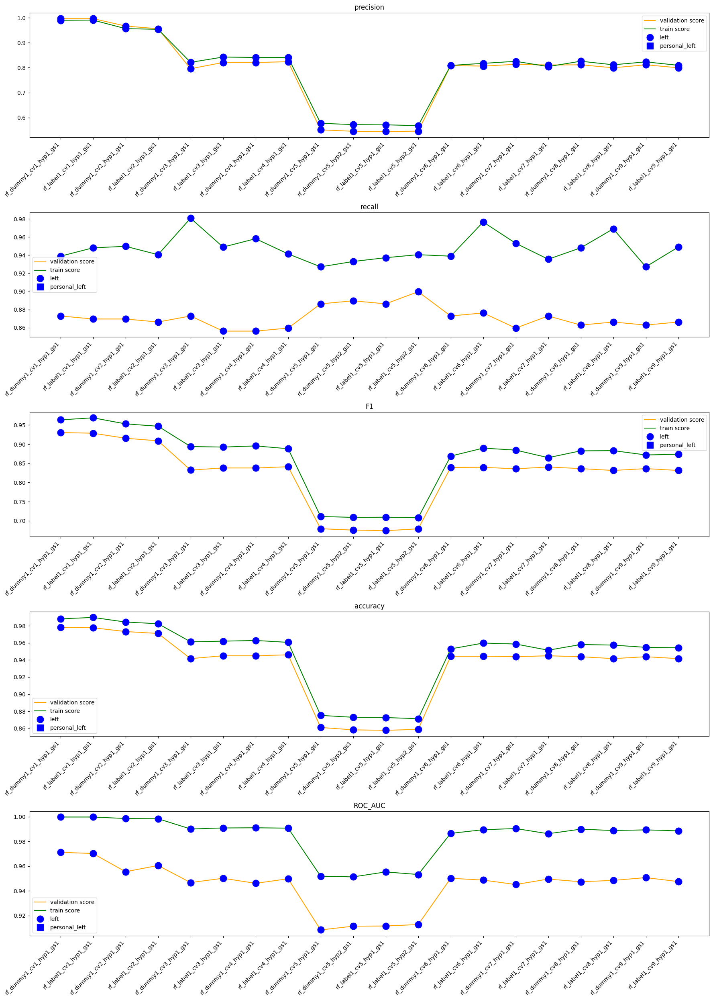

In [32]:
##############################################
#Show Validation Results
##############################################

fig, axs = plt.subplots(5, 1, figsize=(18,25))

metrics=['precision','recall', 'F1','accuracy','ROC_AUC']

#plot validation scores
for metric, ax in zip(metrics, axs.ravel()):
    ax.plot(rf_val_score['model'], rf_val_score[metric], color='orange', label='validation score')
    ax.plot(rf_train_score['model'], rf_train_score[metric], color='green', label='train score')
    
    
    substr_list=[
        #left
        '_dummy1_|_label1_',
        #personal_left
        '_dummy2_|_label2_',
    ]
    marker_list=['bo','bs']
    markersize_list=[12,12]
    for substr,unit_marker, unit_marker_size, unit_index in zip(substr_list,marker_list,markersize_list,range(1,len(substr_list)+1)):
        ax.plot(rf_val_score[rf_val_score['model'].str.contains(substr)]['model'], rf_val_score[rf_val_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size,label=f"{depedent_variables[unit_index-1]}")
        ax.plot(rf_train_score[rf_train_score['model'].str.contains(substr)]['model'], rf_train_score[rf_train_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size)

    ax.set_title(metric)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    #ax.tick_params(labelrotation=90)
    #xlabels=rf_val_score['model'].append(rf_train_score['model'])
    #ax.set_xticklabels(xlabels, rotation=45, ha='right', rotation_mode="anchor")
    ax.legend()

plt.tight_layout()
plt.show()

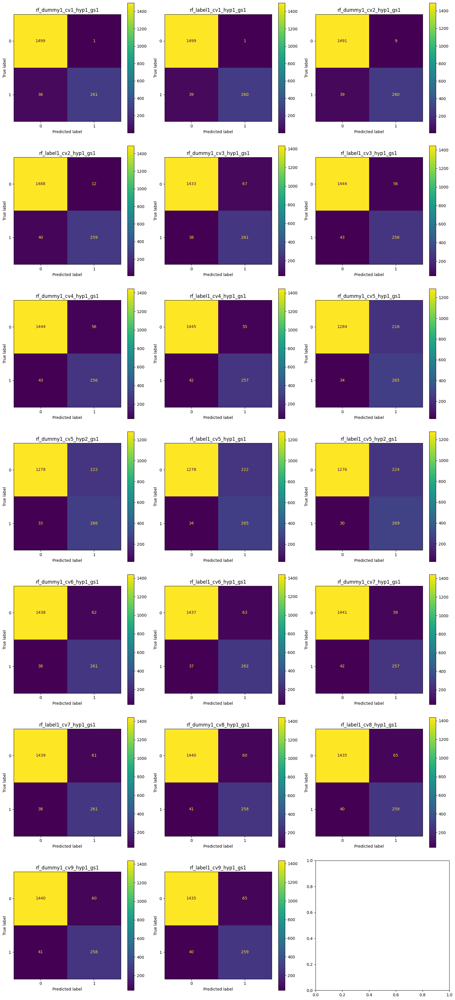

In [33]:
#################################################################################
##Display confusion on validation data
#################################################################################
rowCount=math.ceil(len(rf_cv_list)/3)
fig, axes = plt.subplots(nrows=rowCount, ncols=3, figsize=(16,rowCount*5))

for rf_cv, ax, index in zip(rf_cv_list, axes.flatten(), range(len(rf_cv_list))):
    rf_best=rf_cv.best_estimator_
    
    #pickle file rf_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(rf_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'rf_dummy' in rf_model_name_list[index]:
        target_index=find_number(rf_model_name_list[index], 'rf_dummy')[0]-1
        X_dummy_val=X_dummy_val_list[target_index]
        y_dummy_val=y_dummy_val_list[target_index]
        select_feature=get_fit_features(select_col,X_dummy_val.columns,'dummy')
        confusion_matrix_plot_ax(rf_cv, 
                              X_dummy_val[select_feature], 
                              y_dummy_val, 
                              ax=ax, 
                              title=rf_model_name_list[index])
        
    elif 'rf_label' in rf_model_name_list[index]:
        target_index=find_number(rf_model_name_list[index], 'rf_label')[0]-1
        X_label_val=X_label_val_list[target_index]
        y_label_val=y_label_val_list[target_index]
        select_feature=get_fit_features(select_col,X_label_val.columns,'label')
        confusion_matrix_plot_ax(rf_cv, 
                              X_label_val[select_feature],
                              y_label_val, 
                              ax=ax, 
                              title=rf_model_name_list[index])

plt.tight_layout()
plt.show()

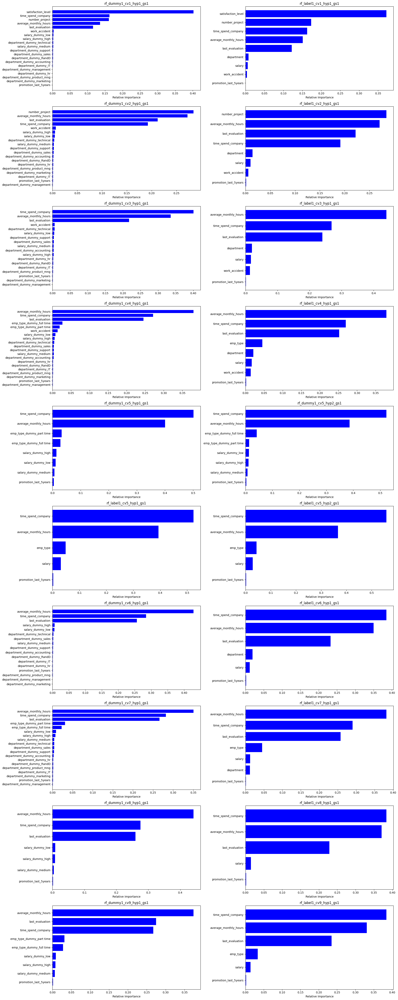

In [34]:
#############################################################
#Plot feature importance
#############################################################
import math

rowCount=math.ceil(len(rf_cv_list)/2)
fig, axes = plt.subplots(nrows=rowCount, ncols=2, figsize=(20,rowCount*5))

for rf_cv, ax, index in zip(rf_cv_list, axes.flatten(), range(len(rf_cv_list))):
    rf_best=rf_cv.best_estimator_
    importances = rf_best.feature_importances_

    #pickle file rf_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(rf_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'rf_dummy' in rf_model_name_list[index]:
        features=get_fit_features(select_col,X_dummy_val.columns,'dummy')
    elif 'rf_label' in rf_model_name_list[index]:
        features=get_fit_features(select_col,X_label_val.columns,'label')

    indices = np.argsort(importances)

    # customized number
    if len(importances)>=25:
        num_features = 25
    else:
        num_features =len(importances)

    ax.set_title(rf_model_name_list[index])
    # only plot the customized number of features
    ax.barh(range(num_features), importances[indices[-num_features:]], color='b', align='center')
    ax.set_xlabel('Relative Importance')
    #ax.set_yticks(range(num_features),[features[i] for i in indices[-num_features:]])
    ax.set_yticks(range(num_features))
    ax.set_yticklabels([features[i] for i in indices[-num_features:]])

plt.tight_layout()
plt.show()

#when use satisdaction_level, satisdaction_level was an important feature
#when use number_project, number_project was an important feature
#according to EDA, there are patterns amoung number_project, time_spend_company, evaluation, satisfaction, average_monthly_time
#=>it might indicate this dataset is not random sampled, many employees shared many similarities
#=>they might come from the same projects or has something in common(e.g. they are responsable for the same region or same type of car)

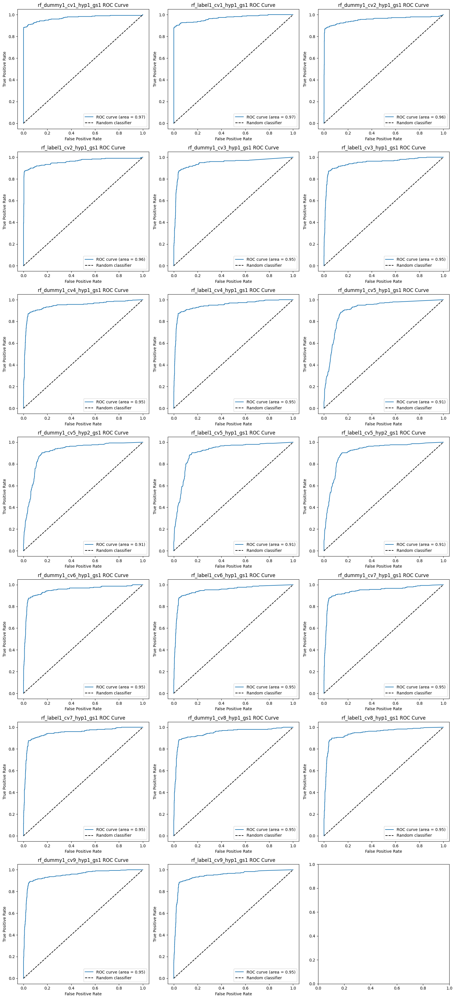

In [35]:
#############################################################
#Plot AUC curve
#############################################################
rowCount=math.ceil(len(rf_cv_list)/3)
fig, axes = plt.subplots(nrows=rowCount, ncols=3, figsize=(16,rowCount*5))

for rf_cv, ax, index in zip(rf_cv_list, axes.flatten(), range(len(rf_cv_list))):
    rf_best=rf_cv.best_estimator_
    
    #pickle file rf_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(rf_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'rf_dummy' in rf_model_name_list[index]:
        target_index=find_number(rf_model_name_list[index], 'rf_dummy')[0]-1
        X_dummy_val=X_dummy_val_list[target_index]
        y_dummy_val=y_dummy_val_list[target_index]
        select_feature=get_fit_features(select_col,X_dummy_val.columns,'dummy')
        # plot ROC curve
        rf_preds_proba=rf_best.predict_proba(X_dummy_val[select_feature])[:, 1]
        fpr, tpr, thresholds = roc_curve(y_dummy_val, rf_preds_proba, pos_label=1)
        roc_auc = roc_auc_score(y_dummy_val, rf_preds_proba)
        ax.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
        ax.plot([0, 1], [0, 1], 'k--', label='Random classifier') 
        ax.set_xlabel('False Positive Rate') 
        ax.set_ylabel('True Positive Rate') 
        ax.set_title(f'{rf_model_name_list[index]} ROC Curve')
        ax.legend(loc="lower right")
        
    elif 'rf_label' in rf_model_name_list[index]:
        target_index=find_number(rf_model_name_list[index], 'rf_label')[0]-1
        X_label_val=X_label_val_list[target_index]
        y_label_val=y_label_val_list[target_index]
        select_feature=get_fit_features(select_col,X_label_val.columns,'label')
        # plot ROC curve
        rf_preds_proba=rf_best.predict_proba(X_label_val[select_feature])[:, 1]
        fpr, tpr, thresholds = roc_curve(y_label_val, rf_preds_proba, pos_label=1)
        roc_auc = roc_auc_score(y_label_val, rf_preds_proba)
        ax.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
        ax.plot([0, 1], [0, 1], 'k--', label='Random classifier') 
        ax.set_xlabel('False Positive Rate') 
        ax.set_ylabel('True Positive Rate') 
        ax.set_title(f'{rf_model_name_list[index]} ROC Curve')
        ax.legend(loc="lower right")

plt.tight_layout()
plt.show()

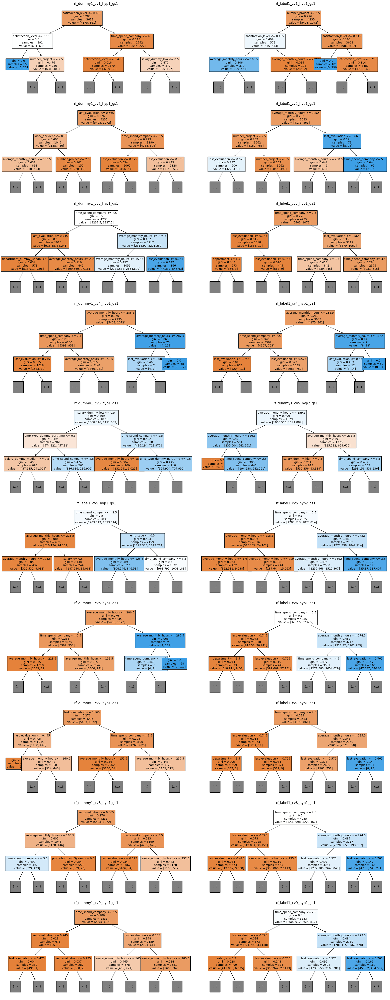

In [36]:
#############################################################
#Plot tree
#############################################################
from sklearn import tree

rowCount=math.ceil(len(rf_cv_list)/2)
fig, axes = plt.subplots(nrows=rowCount, ncols=2, figsize=(20,rowCount*5))

for rf_cv, ax, index in zip(rf_cv_list, axes.flatten(), range(len(rf_cv_list))):
    rf_best=rf_cv.best_estimator_
    importances = rf_best.feature_importances_
    
    #pickle file rf_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(rf_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'rf_dummy' in rf_model_name_list[index]:
        features=get_fit_features(select_col,X_dummy_val.columns,'dummy')
    elif 'rf_label' in rf_model_name_list[index]:
        features=get_fit_features(select_col,X_label_val.columns,'label')
    
    tree.plot_tree(rf_best.estimators_[0],
                   feature_names = features, 
                   #class_names=cn,
                   filled = True,
                   max_depth=2,
                   fontsize=10,
                   ax = ax)
        
    ax.set_title(rf_model_name_list[index])

plt.tight_layout()
plt.show()

#### XGBoost

In [37]:
###################################################
#Copy pickles files to pickle folders
#Output folder will clear after session stop
#need to copy previous results
###################################################
import os
import glob
import shutil
 
source = '/kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/classcification/xgb_pickle/'
destination = path_xgb

# gather all files
allfiles = glob.glob(os.path.join(source, 'xgb_*.pickle'), recursive=True)
#print("Files to copy", allfiles)
 
# iterate on all files to move them to destination folder
for file_path in allfiles:
    dst_path = os.path.join(destination, os.path.basename(file_path))
    shutil.copyfile(file_path, dst_path)
    print(f"Copied {file_path} -> {dst_path}")

Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/classcification/xgb_pickle/xgb_dummy1_cv5_hyp1_gs1.pickle -> /kaggle/working/xgb_pickle/xgb_dummy1_cv5_hyp1_gs1.pickle
Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/classcification/xgb_pickle/xgb_dummy1_cv2_hyp1_gs1.pickle -> /kaggle/working/xgb_pickle/xgb_dummy1_cv2_hyp1_gs1.pickle
Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/classcification/xgb_pickle/xgb_dummy1_cv8_hyp1_gs1.pickle -> /kaggle/working/xgb_pickle/xgb_dummy1_cv8_hyp1_gs1.pickle
Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/classcification/xgb_pickle/xgb_label1_cv1_hyp1_gs1.pickle -> /kaggle/working/xgb_pickle/xgb_label1_cv1_hyp1_gs1.pickle
Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/classcification/xgb_pickle/xgb_dummy1_cv3_hyp1_gs1.pickle -> /kaggle/working/xgb_pickle/xgb_dummy1_cv3_hyp1_gs1.pickle
Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/classcification

In [38]:
def xgb_grid_fit(target_index:int,feature_index:int, hyp_index:int, gs_index:int, encoding_type:str,xgb_classifier, cv=5,refit='f1',score=['accuracy', 'precision', 'recall', 'f1']):
    """
        fit gridsearch
        Input:
            target_index(int): indexof target variable list, strat from 1
            feature_index(int): index of feature list, start from 1
            hyp_index(int): index of hyperparameters list, start from 1
            gs_index(int): grid search index if want to try different cv or refit, start from 1
            encoding_type(str): data encoding type. 'dummy' or 'label'
            xgb_classifier(RandomForestClassifier):RandomForestClassifier
            cv(int):cross-validation generator or an iterable
            refit: Refit an estimator using the best found parameters on the whole dataset
    """
    if (target_index<1) | (feature_index<1) | (hyp_index<1)| (gs_index<1):
        raise Exception("Index start from 1")
    
    feature_len=len(select_col_list)
    target_len=len(depedent_variables)
    # check feature list index range
    if (feature_index > feature_len) | (target_index > target_len):
        raise Exception("feature_index out of range")
    
    chk_encoding_type(encoding_type)
    
    #get feature
    select_col=select_col_list[feature_index-1]
    #https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-callable
    #score=['accuracy', 'precision', 'recall', 'f1']
    pickle_path=path_xgb
    pickle_filenm=f'xgb_{encoding_type}{target_index}_cv{feature_index}_hyp{hyp_index}_gs{gs_index}'
    run_start_time = datetime.datetime.now()
    print(f'{run_start_time}: Fit Start')
    if encoding_type == 'label':
        #check hyperparameters index range
        label_hyp_len=len(xgb_cv_label_params_list)
        if hyp_index > label_hyp_len:
            raise Exception("hyp_index out of range")
        #get hypemeter
        hyp_params=xgb_cv_label_params_list[hyp_index-1]
        #get X variables
        X_label_train=X_label_train_list[target_index-1]
        #get y variable
        y_label_train=y_label_train_list[target_index-1]
        #get feature name list
        select_feature=get_fit_features(select_col,X_label_train.columns,encoding_type)
        #Instantiate the GridSearchCV object
        xgb_label_cv = GridSearchCV(xgb_classifier, hyp_params, scoring=score, cv=cv, refit=refit,n_jobs=-1)
        #print(pd.isna(X_label_train[select_feature]).any(axis=0))
        xgb_label_cv.fit(X_label_train[select_feature], y_label_train)
        write_pickle(pickle_path, xgb_label_cv, pickle_filenm)
    elif encoding_type == 'dummy':
        #check hyperparameters index range
        dummy_hyp_len=len(xgb_cv_dummy_params_list)
        if hyp_index > dummy_hyp_len:
            raise Exception("hyp_index out of range")
        #get hypemeter
        hyp_params=xgb_cv_dummy_params_list[hyp_index-1]
        #get X variables
        X_dummy_train=X_dummy_train_list[target_index-1]
        #get y variable
        y_dummy_train=y_dummy_train_list[target_index-1]
        #get feature name list
        select_feature=get_fit_features(select_col,X_dummy_train.columns,encoding_type)
        #Instantiate the GridSearchCV object
        xgb_dummy_cv = GridSearchCV(xgb_classifier, hyp_params, scoring=score, cv=cv, refit=refit,n_jobs=-1)
        #print(pd.isna(X_dummy_train[select_feature]).any(axis=0))
        xgb_dummy_cv.fit(X_dummy_train[select_feature], y_dummy_train)
        write_pickle(pickle_path, xgb_dummy_cv, pickle_filenm)
    else:
        raise Exception("Only 'dummy' or 'label' allowed")
    run_end_time = datetime.datetime.now()
    print('**************Fit parameters******************')
    print('select_col: ',select_col)
    print('select_feature: ',select_feature)
    print('hyp_params: ',hyp_params)
    print('encoding_type: ',encoding_type)
    print('cv: ',cv)
    print('refit: ',refit)
    print('pickle file name: ',pickle_filenm)
    print('**************Fit parameters******************')
    print(f'{run_end_time}: Fit End')
    print(f'Fit duration: {compute_run_duration(run_start_time,run_end_time)}')

def xgb_read_pickle(target_index,feature_index, hyp_index, gs_index, encoding_type,path):
    xgb_cv_list=[]
    xgb_model_name_list=[]
    target_index_list=compute_index_list(target_index)
    feature_index_list=compute_index_list(feature_index)
    hyp_index_list=compute_index_list(hyp_index)
    gs_index_list=compute_index_list(gs_index)
    encoding_type_list=compute_encoding_list(encoding_type)
    for target_index in target_index_list:
        for feature_index in feature_index_list:
            for encoding_type in encoding_type_list:
                for hyp_index in hyp_index_list:
                    for gs_index in gs_index_list:
                        saved_model_name=f'xgb_{encoding_type}{target_index}_cv{feature_index}_hyp{hyp_index}_gs{gs_index}'
                        if check_picklefile_exists(path, saved_model_name)==True:
                            print(saved_model_name)
                            xgb=read_pickle(path, saved_model_name)
                            xgb_model_name_list.append(saved_model_name)
                            xgb_cv_list.append(xgb)  
    return xgb_cv_list,xgb_model_name_list

In [39]:
select_index=5
select_col=select_col_list[select_index-1]
dummy_feature=get_fit_features(select_col,X_dummy_train.columns,'dummy')
label_feature=get_fit_features(select_col,X_label_train.columns,'label')
#print(dummy_feature)
print(label_feature)
result={
    'sqrt dummy': np.sqrt(len(X_dummy_train[dummy_feature].columns)),
    'log dummy': np.log(len(X_dummy_train[dummy_feature].columns)),
    '0.2 dummy': len(X_dummy_train[dummy_feature].columns)*0.2,
    '0.3 dummy': len(X_dummy_train[dummy_feature].columns)*0.3,
    '0.4 dummy': len(X_dummy_train[dummy_feature].columns)*0.4,
    '0.5 dummy': len(X_dummy_train[dummy_feature].columns)*0.5,
    '0.7 dummy': len(X_dummy_train[dummy_feature].columns)*0.7,
    '0.9 dummy': len(X_dummy_train[dummy_feature].columns)*0.9,
    '1 dummy': len(X_dummy_train[dummy_feature].columns)*1,
    'sqrt label': np.sqrt(len(X_label_train[label_feature].columns)),
    'log label': np.log(len(X_label_train[label_feature].columns)),
    '0.3 label': (len(X_label_train[label_feature].columns))*0.3,
    '0.5 label': (len(X_label_train[label_feature].columns))*0.5,
    '0.7 label': (len(X_label_train[label_feature].columns))*0.7,
    '0.9 label': (len(X_label_train[label_feature].columns))*0.9,
    '1 label': (len(X_label_train[label_feature].columns))*1,
}
pd.DataFrame(data=[result])

['average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'salary', 'emp_type']


,sqrt dummy,log dummy,0.2 dummy,0.3 dummy,0.4 dummy,0.5 dummy,0.7 dummy,0.9 dummy,1 dummy,sqrt label,log label,0.3 label,0.5 label,0.7 label,0.9 label,1 label
0,2.828427,2.079442,1.6,2.4,3.2,4.0,5.6,7.2,8,2.236068,1.609438,1.5,2.5,3.5,4.5,5


In [40]:
#https://xgboost.readthedocs.io/en/latest/parameter.html
#scale_pos_weight: Control the balance of positive and negative weights, 
#useful for unbalanced classes. 
#A typical value to consider: sum(negative instances) / sum(positive instances)
total_count=df_sample.shape[0]
for dep_var in depedent_variables:
    positive_cnt=df_sample[dep_var].sum()
    negative_cnt=total_count-positive_cnt
    negative_positive_ratio=round(negative_cnt/positive_cnt,1)
    print(dep_var,negative_positive_ratio)

left 5.0
personal_left 61.8


In [41]:
xgb = XGBClassifier(objective='binary:logistic', random_state=RANDOM_STATE)

#https://xgboost.readthedocs.io/en/latest/parameter.html#parameters-for-tree-booster
xgb_cv_dummy_params_list=[
    #index:1
    {'max_depth': [5,7,9,11], 
     'min_child_weight': [1],
     'learning_rate': [0.1, 0.2, 0.3],
     'n_estimators': [80, 120, 160],
     'subsample':[0.3, 0.5, 0.7, 0.9],
     'colsample_bytree':[0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9,1],
     'scale_pos_weight':[1,5],
    },
]

xgb_cv_label_params_list=[
    #index:1
    {'max_depth': [5,7,9,11], 
     'min_child_weight': [1],
     'learning_rate': [0.1, 0.2, 0.3],
     'n_estimators': [80, 120, 160],
     'subsample':[0.3, 0.5, 0.7, 0.9],
     'colsample_bytree':[0.4, 0.5, 0.6, 0.7, 0.8, 0.9,1],
     'scale_pos_weight':[1,5],
    },
]

In [42]:
%%script True
####################################################
#target_index:[1]
#feature_index:[1]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:5
####################################################
target_index_list=[1]
feature_index_list=[1]
#hyparameter index,start from 1
hyp_index_list=[1]

for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
            xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='dummy', xgb_classifier=xgb,cv=5, refit='f1')
            xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')



#2025-03-12 06:15:54.526497: Fit Start
#**************Fit parameters******************
#select_col:  ['satisfaction_level', 'last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department', 'salary']
#select_feature:  ['satisfaction_level', 'last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department_dummy_IT', 'department_dummy_RandD', 'department_dummy_accounting', 'department_dummy_hr', 'department_dummy_management', 'department_dummy_marketing', 'department_dummy_product_mng', 'department_dummy_sales', 'department_dummy_support', 'department_dummy_technical', 'salary_dummy_low', 'salary_dummy_medium', 'salary_dummy_high']
#hyp_params:  {'max_depth': [5, 7, 9, 11], 'min_child_weight': [1], 'learning_rate': [0.1, 0.2, 0.3], 'n_estimators': [80, 120, 160], 'subsample': [0.3, 0.5, 0.7, 0.9], 'colsample_bytree': [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], 'scale_pos_weight': [1, 5]}
#encoding_type:  dummy
#cv:  5
#refit:  f1
#pickle file name:  xgb_dummy1_cv1_hyp1_gs1
#**************Fit parameters******************
#2025-03-12 08:34:33.261677: Fit End
#Fit duration: 138 min 38 s

#2025-03-12 08:34:33.264232: Fit Start
#**************Fit parameters******************
#select_col:  ['satisfaction_level', 'last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department', 'salary']
#select_feature:  ['satisfaction_level', 'last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department', 'salary']
#hyp_params:  {'max_depth': [5, 7, 9, 11], 'min_child_weight': [1], 'learning_rate': [0.1, 0.2, 0.3], 'n_estimators': [80, 120, 160], 'subsample': [0.3, 0.5, 0.7, 0.9], 'colsample_bytree': [0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], 'scale_pos_weight': [1, 5]}
#encoding_type:  label
#cv:  5
#refit:  f1
#pickle file name:  xgb_label1_cv1_hyp1_gs1
#**************Fit parameters******************
#2025-03-12 09:59:30.852761: Fit End
#Fit duration: 84 min 57 s

Couldn't find program: 'True'


In [43]:
%%script True
####################################################
#target_index:[1]
#feature_index:[2]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:5
####################################################
target_index_list=[1]
feature_index_list=[2]
#hyparameter index,start from 1
hyp_index_list=[1]

for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
            xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='dummy', xgb_classifier=xgb,cv=5, refit='f1')
            xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')

            
#2025-03-12 10:08:53.612367: Fit Start
#**************Fit parameters******************
#select_col:  ['last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department', 'salary']
#select_feature:  ['last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department_dummy_IT', 'department_dummy_RandD', 'department_dummy_accounting', 'department_dummy_hr', 'department_dummy_management', 'department_dummy_marketing', 'department_dummy_product_mng', 'department_dummy_sales', 'department_dummy_support', 'department_dummy_technical', 'salary_dummy_low', 'salary_dummy_medium', 'salary_dummy_high']
#hyp_params:  {'max_depth': [5, 7, 9, 11], 'min_child_weight': [1], 'learning_rate': [0.1, 0.2, 0.3], 'n_estimators': [80, 120, 160], 'subsample': [0.3, 0.5, 0.7, 0.9], 'colsample_bytree': [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], 'scale_pos_weight': [1, 5]}
#encoding_type:  dummy
#cv:  5
#refit:  f1
#pickle file name:  xgb_dummy1_cv2_hyp1_gs1
#**************Fit parameters******************
#2025-03-12 12:26:41.144826: Fit End
#Fit duration: 137 min 47 s


#2025-03-12 14:12:49.701182: Fit Start
#**************Fit parameters******************
#select_col:  ['last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department', 'salary']
#select_feature:  ['last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department', 'salary']
#hyp_params:  {'max_depth': [5, 7, 9, 11], 'min_child_weight': [1], 'learning_rate': [0.1, 0.2, 0.3], 'n_estimators': [80, 120, 160], 'subsample': [0.3, 0.5, 0.7, 0.9], 'colsample_bytree': [0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], 'scale_pos_weight': [1, 5]}
#encoding_type:  label
#cv:  5
#refit:  f1
#pickle file name:  xgb_label1_cv2_hyp1_gs1
#**************Fit parameters******************
#2025-03-12 15:41:35.695891: Fit End
#Fit duration: 88 min 45 s

Couldn't find program: 'True'


In [44]:
%%script True
####################################################
#target_index:[1]
#feature_index:[2]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:5
####################################################
target_index_list=[1]
feature_index_list=[5]
#hyparameter index,start from 1
hyp_index_list=[1]

for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
            xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='dummy', xgb_classifier=xgb,cv=5, refit='f1')
            xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')

#2025-03-16 12:42:38.792203: Fit Start
#**************Fit parameters******************
#select_col:  ['average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'salary', 'emp_type']
#select_feature:  ['average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'salary_dummy_low', 'salary_dummy_medium', 'salary_dummy_high', 'emp_type_dummy_full time', 'emp_type_dummy_part time']
#hyp_params:  {'max_depth': [5, 7, 9, 11], 'min_child_weight': [1], 'learning_rate': [0.1, 0.2, 0.3], 'n_estimators': [80, 120, 160], 'subsample': [0.3, 0.5, 0.7, 0.9], 'colsample_bytree': [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], 'scale_pos_weight': [1, 5]}
#encoding_type:  dummy
#cv:  5
#refit:  f1
#pickle file name:  xgb_dummy1_cv5_hyp1_gs1
#**************Fit parameters******************
#2025-03-16 14:10:13.914287: Fit End
#Fit duration: 87 min 35 s

#2025-03-17 01:40:58.161210: Fit Start
#**************Fit parameters******************
#select_col:  ['average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'salary', 'emp_type']
#select_feature:  ['average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'salary', 'emp_type']
#hyp_params:  {'max_depth': [5, 7, 9, 11], 'min_child_weight': [1], 'learning_rate': [0.1, 0.2, 0.3], 'n_estimators': [80, 120, 160], 'subsample': [0.3, 0.5, 0.7, 0.9], 'colsample_bytree': [0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], 'scale_pos_weight': [1, 5]}
#encoding_type:  label
#cv:  5
#refit:  f1
#pickle file name:  xgb_label1_cv5_hyp1_gs1
#**************Fit parameters******************
#2025-03-17 02:47:53.109724: Fit End
#Fit duration: 66 min 54 s

Couldn't find program: 'True'


In [45]:
%%script True
####################################################
#target_index:[1]
#feature_index:[6]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:5
####################################################
target_index_list=[1]
feature_index_list=[6]
#hyparameter index,start from 1
hyp_index_list=[1]

for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
            xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')
            xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='dummy', xgb_classifier=xgb,cv=5, refit='f1')

#2025-03-19 06:07:37.765942: Fit Start
#**************Fit parameters******************
#select_col:  ['last_evaluation', 'average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'department', 'salary']
#select_feature:  ['last_evaluation', 'average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'department', 'salary']
#hyp_params:  {'max_depth': [5, 7, 9, 11], 'min_child_weight': [1], 'learning_rate': [0.1, 0.2, 0.3], 'n_estimators': [80, 120, 160], 'subsample': [0.3, 0.5, 0.7, 0.9], 'colsample_bytree': [0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], 'scale_pos_weight': [1, 5]}
#encoding_type:  label
#cv:  5
#refit:  f1
#pickle file name:  xgb_label1_cv6_hyp1_gs1
#**************Fit parameters******************
#2025-03-19 07:27:05.077146: Fit End
#Fit duration: 79 min 27 s

#2025-03-19 07:27:05.080373: Fit Start
#**************Fit parameters******************
#select_col:  ['last_evaluation', 'average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'department', 'salary']
#select_feature:  ['last_evaluation', 'average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'department_dummy_IT', 'department_dummy_RandD', 'department_dummy_accounting', 'department_dummy_hr', 'department_dummy_management', 'department_dummy_marketing', 'department_dummy_product_mng', 'department_dummy_sales', 'department_dummy_support', 'department_dummy_technical', 'salary_dummy_low', 'salary_dummy_medium', 'salary_dummy_high']
#hyp_params:  {'max_depth': [5, 7, 9, 11], 'min_child_weight': [1], 'learning_rate': [0.1, 0.2, 0.3], 'n_estimators': [80, 120, 160], 'subsample': [0.3, 0.5, 0.7, 0.9], 'colsample_bytree': [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], 'scale_pos_weight': [1, 5]}
#encoding_type:  dummy
#cv:  5
#refit:  f1
#pickle file name:  xgb_dummy1_cv6_hyp1_gs1
#**************Fit parameters******************
#2025-03-19 09:39:13.112397: Fit End
#Fit duration: 132 min 8 s

Couldn't find program: 'True'


In [46]:
%%script True
####################################################
#target_index:[1]
#feature_index:[7]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:5
####################################################
target_index_list=[1]
feature_index_list=[7]
#hyparameter index,start from 1
hyp_index_list=[1]

for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
            #xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')
            xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='dummy', xgb_classifier=xgb,cv=5, refit='f1')

#2025-03-19 09:48:54.782385: Fit Start
#**************Fit parameters******************
#select_col:  ['last_evaluation', 'average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'department', 'salary', 'emp_type']
#select_feature:  ['last_evaluation', 'average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'department', 'salary', 'emp_type']
#hyp_params:  {'max_depth': [5, 7, 9, 11], 'min_child_weight': [1], 'learning_rate': [0.1, 0.2, 0.3], 'n_estimators': [80, 120, 160], 'subsample': [0.3, 0.5, 0.7, 0.9], 'colsample_bytree': [0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], 'scale_pos_weight': [1, 5]}
#encoding_type:  label
#cv:  5
#refit:  f1
#pickle file name:  xgb_label1_cv7_hyp1_gs1
#**************Fit parameters******************
#2025-03-19 11:08:38.916779: Fit End
#Fit duration: 79 min 44 s


#2025-03-20 02:41:02.238110: Fit Start
#**************Fit parameters******************
#select_col:  ['last_evaluation', 'average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'department', 'salary', 'emp_type']
#select_feature:  ['last_evaluation', 'average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'department_dummy_IT', 'department_dummy_RandD', 'department_dummy_accounting', 'department_dummy_hr', 'department_dummy_management', 'department_dummy_marketing', 'department_dummy_product_mng', 'department_dummy_sales', 'department_dummy_support', 'department_dummy_technical', 'salary_dummy_low', 'salary_dummy_medium', 'salary_dummy_high', 'emp_type_dummy_full time', 'emp_type_dummy_part time']
#hyp_params:  {'max_depth': [5, 7, 9, 11], 'min_child_weight': [1], 'learning_rate': [0.1, 0.2, 0.3], 'n_estimators': [80, 120, 160], 'subsample': [0.3, 0.5, 0.7, 0.9], 'colsample_bytree': [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], 'scale_pos_weight': [1, 5]}
#encoding_type:  dummy
#cv:  5
#refit:  f1
#pickle file name:  xgb_dummy1_cv7_hyp1_gs1
#**************Fit parameters******************
#2025-03-20 04:59:30.202537: Fit End
#Fit duration: 138 min 27 s

Couldn't find program: 'True'


In [47]:
%%script True
####################################################
#target_index:[1]
#feature_index:[8]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:5
####################################################
target_index_list=[1]
feature_index_list=[8]
#hyparameter index,start from 1
hyp_index_list=[1]

for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
            xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')
            xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='dummy', xgb_classifier=xgb,cv=5, refit='f1')


Couldn't find program: 'True'


In [48]:
%%script True
####################################################
#target_index:[1]
#feature_index:[9]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:5
####################################################
target_index_list=[1]
feature_index_list=[9]
#hyparameter index,start from 1
hyp_index_list=[1]

for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
            xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')
            xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='dummy', xgb_classifier=xgb,cv=5, refit='f1')

#2025-03-24 08:17:13.667601: Fit Start
#**************Fit parameters******************
#select_col:  ['last_evaluation', 'average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'salary', 'emp_type']
#select_feature:  ['last_evaluation', 'average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'salary', 'emp_type']
#hyp_params:  {'max_depth': [5, 7, 9, 11], 'min_child_weight': [1], 'learning_rate': [0.1, 0.2, 0.3], 'n_estimators': [80, 120, 160], 'subsample': [0.3, 0.5, 0.7, 0.9], 'colsample_bytree': [0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], 'scale_pos_weight': [1, 5]}
#encoding_type:  label
#cv:  5
#refit:  f1
#pickle file name:  xgb_label1_cv9_hyp1_gs1
#**************Fit parameters******************
#2025-03-24 09:37:45.050643: Fit End
#Fit duration: 80 min 31 s

#2025-03-24 09:37:45.054428: Fit Start
#**************Fit parameters******************
#select_col:  ['last_evaluation', 'average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'salary', 'emp_type']
#select_feature:  ['last_evaluation', 'average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'salary_dummy_low', 'salary_dummy_medium', 'salary_dummy_high', 'emp_type_dummy_full time', 'emp_type_dummy_part time']
#hyp_params:  {'max_depth': [5, 7, 9, 11], 'min_child_weight': [1], 'learning_rate': [0.1, 0.2, 0.3], 'n_estimators': [80, 120, 160], 'subsample': [0.3, 0.5, 0.7, 0.9], 'colsample_bytree': [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], 'scale_pos_weight': [1, 5]}
#encoding_type:  dummy
#cv:  5
#refit:  f1
#pickle file name:  xgb_dummy1_cv9_hyp1_gs1
#**************Fit parameters******************
#2025-03-24 11:19:35.579677: Fit End
#Fit duration: 101 min 50 s

Couldn't find program: 'True'


In [49]:
%%script True
####################################################
#target_index:[1]
#feature_index:[3]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:5
####################################################
target_index_list=[1]
feature_index_list=[3]
#hyparameter index,start from 1
hyp_index_list=[1]

for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
            xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')
            xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='dummy', xgb_classifier=xgb,cv=5, refit='f1')


Couldn't find program: 'True'


In [50]:
%%script True
####################################################
#target_index:[1]
#feature_index:[4]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:5
####################################################
target_index_list=[1]
feature_index_list=[4]
#hyparameter index,start from 1
hyp_index_list=[1]

for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
            xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')
            xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='dummy', xgb_classifier=xgb,cv=5, refit='f1')

#2025-03-26 08:23:06.612361: Fit Start
#**************Fit parameters******************
#select_col:  ['last_evaluation', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department', 'salary', 'emp_type']
#select_feature:  ['last_evaluation', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department', 'salary', 'emp_type']
#hyp_params:  {'max_depth': [5, 7, 9, 11], 'min_child_weight': [1], 'learning_rate': [0.1, 0.2, 0.3], 'n_estimators': [80, 120, 160], 'subsample': [0.3, 0.5, 0.7, 0.9], 'colsample_bytree': [0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], 'scale_pos_weight': [1, 5]}
#encoding_type:  label
#cv:  5
#refit:  f1
#pickle file name:  xgb_label1_cv4_hyp1_gs1
#**************Fit parameters******************
#2025-03-26 09:47:14.242295: Fit End
#Fit duration: 84 min 7 s

Couldn't find program: 'True'


In [51]:
###################################################
#Read from pickle
###################################################
#feature_index=1
#hyp_index=1
#gs_index=1
target_len=len(depedent_variables)
feature_len=len(select_col_list)
#feature_len=1
hyp_len=max(len(xgb_cv_label_params_list),len(xgb_cv_dummy_params_list))
gs_len=5
encoding_type=['dummy','label']
xgb_cv_list,xgb_model_name_list=xgb_read_pickle(target_len,feature_len, hyp_len, gs_len, encoding_type,path_xgb)

xgb_dummy1_cv1_hyp1_gs1
xgb_label1_cv1_hyp1_gs1
xgb_dummy1_cv2_hyp1_gs1
xgb_label1_cv2_hyp1_gs1
xgb_dummy1_cv3_hyp1_gs1
xgb_label1_cv3_hyp1_gs1
xgb_dummy1_cv4_hyp1_gs1
xgb_label1_cv4_hyp1_gs1
xgb_dummy1_cv5_hyp1_gs1
xgb_label1_cv5_hyp1_gs1
xgb_dummy1_cv6_hyp1_gs1
xgb_label1_cv6_hyp1_gs1
xgb_dummy1_cv7_hyp1_gs1
xgb_label1_cv7_hyp1_gs1
xgb_dummy1_cv8_hyp1_gs1
xgb_label1_cv8_hyp1_gs1
xgb_dummy1_cv9_hyp1_gs1
xgb_label1_cv9_hyp1_gs1


In [52]:
from platform import python_version

print(python_version())

3.11.11


In [53]:
###################################################
#Examine the best combination of hyperparameters.
###################################################
xgb_best_hyperparameters=pd.DataFrame()
for index in range(len(xgb_cv_list)):
    xgb_row=xgb_cv_list[index].best_params_
    xgb_row['xgb Model name']=xgb_model_name_list[index]
    df_dictionary = pd.DataFrame([xgb_row])
    xgb_best_hyperparameters = pd.concat([xgb_best_hyperparameters, df_dictionary], ignore_index=True)

xgb_best_hyperparameters.to_csv('xgb_best_hyperparameters.csv', index=False)
xgb_best_hyperparameters

,colsample_bytree,learning_rate,max_depth,min_child_weight,n_estimators,scale_pos_weight,subsample,xgb Model name
0,0.7,0.1,9,1,80,1,0.9,xgb_dummy1_cv1_hyp1_gs1
1,0.7,0.1,9,1,80,1,0.9,xgb_label1_cv1_hyp1_gs1
2,0.7,0.1,7,1,120,1,0.9,xgb_dummy1_cv2_hyp1_gs1
3,0.8,0.1,9,1,80,1,0.9,xgb_label1_cv2_hyp1_gs1
4,0.5,0.1,9,1,120,5,0.9,xgb_dummy1_cv3_hyp1_gs1
5,0.8,0.1,11,1,80,5,0.9,xgb_label1_cv3_hyp1_gs1
6,0.6,0.1,9,1,80,5,0.5,xgb_dummy1_cv4_hyp1_gs1
7,0.7,0.1,7,1,80,1,0.9,xgb_label1_cv4_hyp1_gs1
8,0.9,0.1,5,1,80,5,0.7,xgb_dummy1_cv5_hyp1_gs1
9,0.6,0.1,7,1,120,5,0.3,xgb_label1_cv5_hyp1_gs1


In [54]:
###################################################
#Training Results
###################################################
xgb_train_score_list=[]
for xgb_cv, index in zip(xgb_cv_list, range(len(xgb_cv_list))):
    xgb_best=xgb_cv.best_estimator_
    #pickle file xgb_[dummy|label]_cvXX_hyp*_gs* XX was index
    params_index=find_number(xgb_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'xgb_dummy' in xgb_model_name_list[index]:
        target_index=find_number(xgb_model_name_list[index], 'xgb_dummy')[0]-1
        X_dummy_train=X_dummy_train_list[target_index]
        y_dummy_train=y_dummy_train_list[target_index]
        select_feature=get_fit_features(select_col,X_dummy_train.columns,'dummy')
        xgb_preds=xgb_best.predict(X_dummy_train[select_feature])
        xgb_preds_proba=xgb_best.predict_proba(X_dummy_train[select_feature])[:, 1]
        train_score=get_test_scores(xgb_model_name_list[index], xgb_preds, y_dummy_train,xgb_preds_proba)
    elif 'xgb_label' in xgb_model_name_list[index]:
        target_index=find_number(xgb_model_name_list[index], 'xgb_label')[0]-1
        X_label_train=X_label_train_list[target_index]
        y_label_train=y_label_train_list[target_index]
        select_feature=get_fit_features(select_col,X_label_train.columns,'label')
        xgb_preds=xgb_best.predict(X_label_train[select_feature])
        xgb_preds_proba=xgb_best.predict_proba(X_label_train[select_feature])[:, 1]
        train_score=get_test_scores(xgb_model_name_list[index], xgb_preds, y_label_train,xgb_preds_proba)
    
    xgb_train_score_list.append(train_score)

xgb_train_score=pd.concat(xgb_train_score_list).reset_index(drop=True)
xgb_train_score.to_csv('xgb_train_score.csv', index=False)
xgb_train_score

,model,precision,recall,F1,accuracy,ROC_AUC
0,xgb_dummy1_cv1_hyp1_gs1,0.991197,0.943049,0.966524,0.989158,0.998932
1,xgb_label1_cv1_hyp1_gs1,0.991213,0.944724,0.967410,0.989436,0.998968
2,xgb_dummy1_cv2_hyp1_gs1,0.961571,0.943049,0.952220,0.984292,0.997197
3,xgb_label1_cv2_hyp1_gs1,0.963979,0.941374,0.952542,0.984431,0.997466
4,xgb_dummy1_cv3_hyp1_gs1,0.834850,0.999162,0.909645,0.967056,0.994585
5,xgb_label1_cv3_hyp1_gs1,0.850427,1.000000,0.919169,0.970809,0.996531
6,xgb_dummy1_cv4_hyp1_gs1,0.820280,0.982412,0.894055,0.961357,0.992278
7,xgb_label1_cv4_hyp1_gs1,0.848649,0.920436,0.883086,0.959550,0.985747
8,xgb_dummy1_cv5_hyp1_gs1,0.559583,0.943886,0.702618,0.867389,0.948642
9,xgb_label1_cv5_hyp1_gs1,0.561815,0.943886,0.704375,0.868502,0.950829


In [55]:
###################################################
#Validation Results
###################################################
xgb_val_score_list=[]
for xgb_cv, index in zip(xgb_cv_list, range(len(xgb_cv_list))):
    xgb_best=xgb_cv.best_estimator_
    
    #pickle file xgb_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(xgb_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'xgb_dummy' in xgb_model_name_list[index]:
        target_index=find_number(xgb_model_name_list[index], 'xgb_dummy')[0]-1
        X_dummy_val=X_dummy_val_list[target_index]
        y_dummy_val=y_dummy_val_list[target_index]
        select_feature=get_fit_features(select_col,X_dummy_val.columns,'dummy')
        xgb_preds=xgb_best.predict(X_dummy_val[select_feature])
        xgb_preds_proba=xgb_best.predict_proba(X_dummy_val[select_feature])[:, 1]
        val_score=get_test_scores(xgb_model_name_list[index], xgb_preds, y_dummy_val,xgb_preds_proba)
        
    elif 'xgb_label' in xgb_model_name_list[index]:
        target_index=find_number(xgb_model_name_list[index], 'xgb_label')[0]-1
        X_label_val=X_label_val_list[target_index]
        y_label_val=y_label_val_list[target_index]
        select_feature=get_fit_features(select_col,X_label_val.columns,'label')
        xgb_preds=xgb_best.predict(X_label_val[select_feature])
        xgb_preds_proba=xgb_best.predict_proba(X_label_val[select_feature])[:, 1]
        val_score=get_test_scores(xgb_model_name_list[index], xgb_preds, y_label_val,xgb_preds_proba)
    
    xgb_val_score_list.append(val_score)

xgb_val_score=pd.concat(xgb_val_score_list).reset_index(drop=True)
xgb_val_score.to_csv('xgb_val_score.csv', index=False)
xgb_val_score

,model,precision,recall,F1,accuracy,ROC_AUC
0,xgb_dummy1_cv1_hyp1_gs1,0.992395,0.872910,0.928826,0.977765,0.977886
1,xgb_label1_cv1_hyp1_gs1,1.000000,0.872910,0.932143,0.978877,0.977059
2,xgb_dummy1_cv2_hyp1_gs1,0.951852,0.859532,0.903339,0.969427,0.969104
3,xgb_label1_cv2_hyp1_gs1,0.959259,0.866221,0.910369,0.971651,0.966038
4,xgb_dummy1_cv3_hyp1_gs1,0.804878,0.882943,0.842105,0.944969,0.956213
5,xgb_label1_cv3_hyp1_gs1,0.811912,0.866221,0.838188,0.944414,0.951424
6,xgb_dummy1_cv4_hyp1_gs1,0.795732,0.872910,0.832536,0.941634,0.954567
7,xgb_label1_cv4_hyp1_gs1,0.833333,0.836120,0.834725,0.944969,0.956436
8,xgb_dummy1_cv5_hyp1_gs1,0.532544,0.903010,0.669975,0.852140,0.920454
9,xgb_label1_cv5_hyp1_gs1,0.533597,0.903010,0.670807,0.852696,0.914011


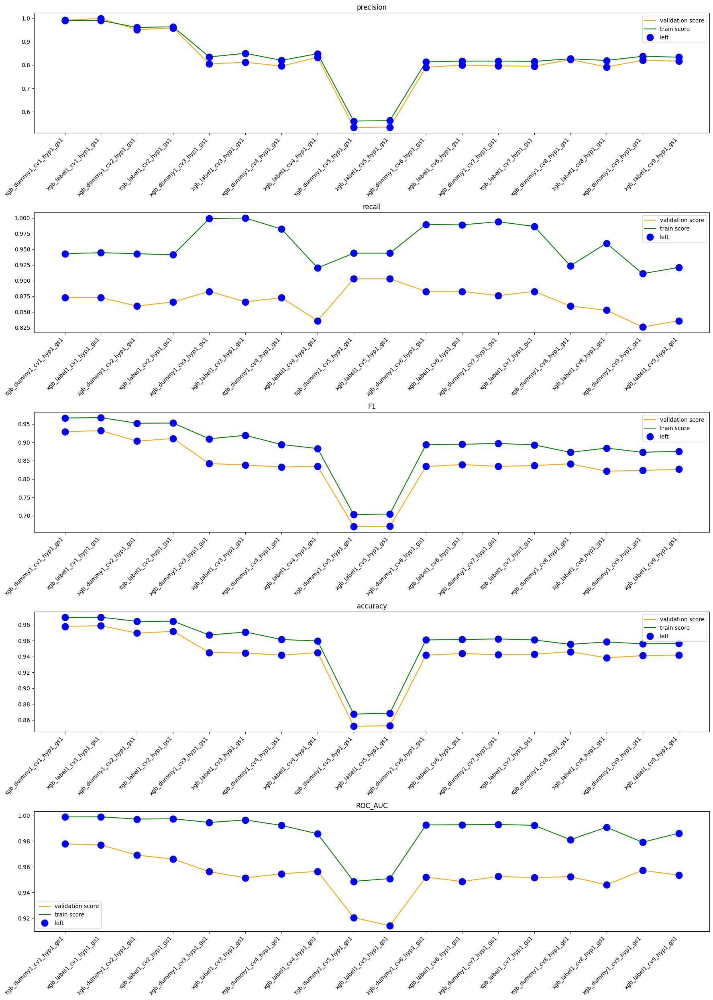

In [56]:
##############################################
#Show Validation Results
##############################################
fig, axs = plt.subplots(5, 1, figsize=(18,25))

metrics=['precision','recall', 'F1','accuracy','ROC_AUC']

#plot validation scores
for metric, ax in zip(metrics, axs.ravel()):
    ax.plot(xgb_val_score['model'], xgb_val_score[metric], color='orange', label='validation score')
    ax.plot(xgb_train_score['model'], xgb_train_score[metric], color='green', label='train score')
    
    #add marker to target variables
    substr_list=[
        #left
        '_dummy1_|_label1_',
    ]
    marker_list=['bo']
    markersize_list=[12]
    for substr,unit_marker, unit_marker_size, unit_index in zip(substr_list,marker_list,markersize_list,range(1,len(substr_list)+1)):
        ax.plot(xgb_val_score[xgb_val_score['model'].str.contains(substr)]['model'], xgb_val_score[xgb_val_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size,label=f"{depedent_variables[unit_index-1]}")
        ax.plot(xgb_train_score[xgb_train_score['model'].str.contains(substr)]['model'], xgb_train_score[xgb_train_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size)

    ax.set_title(metric)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    #ax.tick_params(labelrotation=90)
    ax.legend()

plt.tight_layout()
plt.show()

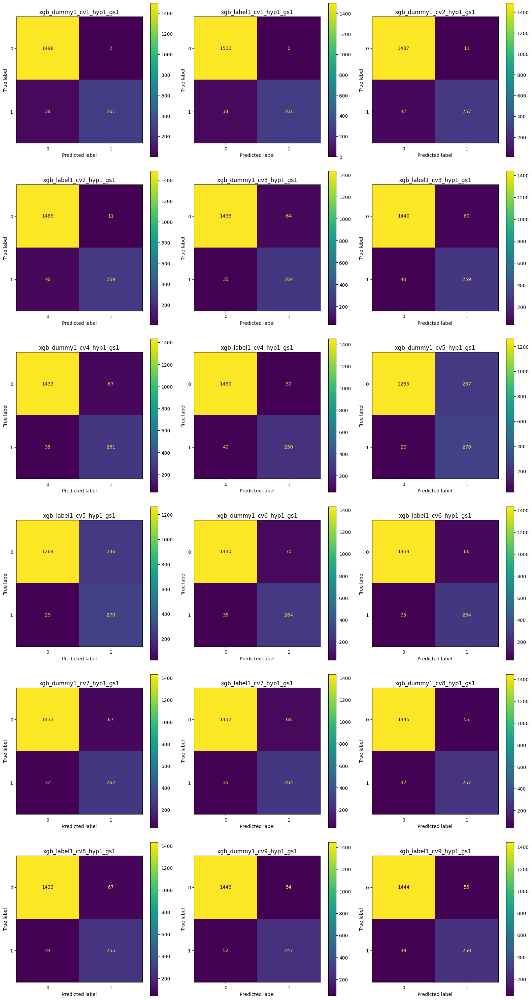

In [57]:
#################################################################################
##Display confusion on validation data
#################################################################################
rowCount=math.ceil(len(xgb_cv_list)/3)
fig, axes = plt.subplots(nrows=rowCount, ncols=3, figsize=(16,rowCount*5))

for xgb_cv, ax, index in zip(xgb_cv_list, axes.flatten(), range(len(xgb_cv_list))):
    xgb_best=xgb_cv.best_estimator_
    
    #pickle file xgb_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(xgb_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'xgb_dummy' in xgb_model_name_list[index]:
        target_index=find_number(xgb_model_name_list[index], 'xgb_dummy')[0]-1
        X_dummy_val=X_dummy_val_list[target_index]
        y_dummy_val=y_dummy_val_list[target_index]
        select_feature=get_fit_features(select_col,X_dummy_val.columns,'dummy')
        confusion_matrix_plot_ax(xgb_cv, 
                              X_dummy_val[select_feature], 
                              y_dummy_val, 
                              ax=ax, 
                              title=xgb_model_name_list[index])
        
    elif 'xgb_label' in xgb_model_name_list[index]:
        target_index=find_number(xgb_model_name_list[index], 'xgb_label')[0]-1
        X_label_val=X_label_val_list[target_index]
        y_label_val=y_label_val_list[target_index]
        select_feature=get_fit_features(select_col,X_label_val.columns,'label')
        confusion_matrix_plot_ax(xgb_cv, 
                              X_label_val[select_feature],
                              y_label_val, 
                              ax=ax, 
                              title=xgb_model_name_list[index])

plt.tight_layout()
plt.show()

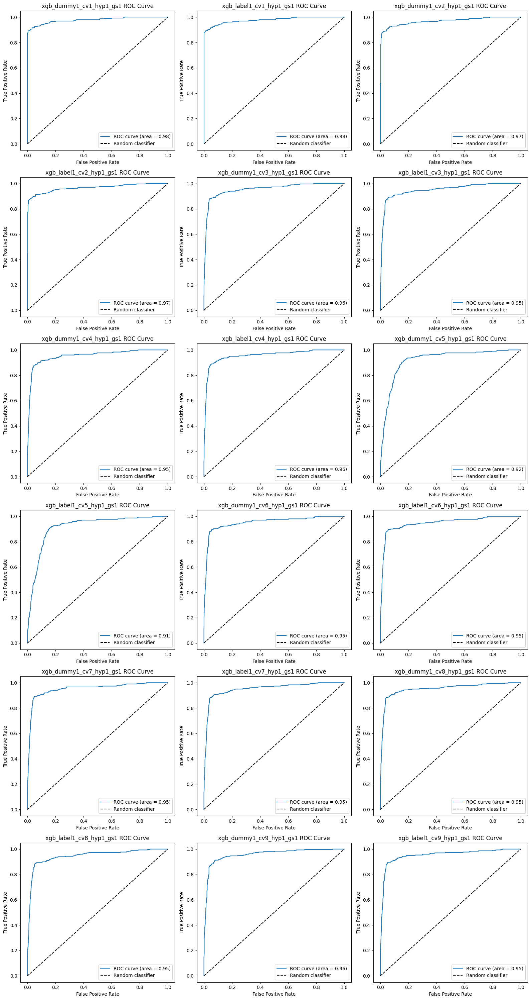

In [58]:
#############################################################
#Plot AUC curve
#############################################################
rowCount=math.ceil(len(xgb_cv_list)/3)
fig, axes = plt.subplots(nrows=rowCount, ncols=3, figsize=(16,rowCount*5))

for xgb_cv, ax, index in zip(xgb_cv_list, axes.flatten(), range(len(xgb_cv_list))):
    xgb_best=xgb_cv.best_estimator_
    
    #pickle file xgb_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(xgb_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'xgb_dummy' in xgb_model_name_list[index]:
        target_index=find_number(xgb_model_name_list[index], 'xgb_dummy')[0]-1
        X_dummy_val=X_dummy_val_list[target_index]
        y_dummy_val=y_dummy_val_list[target_index]
        select_feature=get_fit_features(select_col,X_dummy_val.columns,'dummy')
        # plot ROC curve
        xgb_preds_proba=xgb_best.predict_proba(X_dummy_val[select_feature])[:, 1]
        fpr, tpr, thresholds = roc_curve(y_dummy_val, xgb_preds_proba, pos_label=1)
        roc_auc = roc_auc_score(y_dummy_val, xgb_preds_proba)
        ax.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
        ax.plot([0, 1], [0, 1], 'k--', label='Random classifier') 
        ax.set_xlabel('False Positive Rate') 
        ax.set_ylabel('True Positive Rate') 
        ax.set_title(f'{xgb_model_name_list[index]} ROC Curve')
        ax.legend(loc="lower right")
        
    elif 'xgb_label' in xgb_model_name_list[index]:
        target_index=find_number(xgb_model_name_list[index], 'xgb_label')[0]-1
        X_label_val=X_label_val_list[target_index]
        y_label_val=y_label_val_list[target_index]
        select_feature=get_fit_features(select_col,X_label_val.columns,'label')
        # plot ROC curve
        xgb_preds_proba=xgb_best.predict_proba(X_label_val[select_feature])[:, 1]
        fpr, tpr, thresholds = roc_curve(y_label_val, xgb_preds_proba, pos_label=1)
        roc_auc = roc_auc_score(y_label_val, xgb_preds_proba)
        ax.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
        ax.plot([0, 1], [0, 1], 'k--', label='Random classifier') 
        ax.set_xlabel('False Positive Rate') 
        ax.set_ylabel('True Positive Rate') 
        ax.set_title(f'{xgb_model_name_list[index]} ROC Curve')
        ax.legend(loc="lower right")

plt.tight_layout()
plt.show()

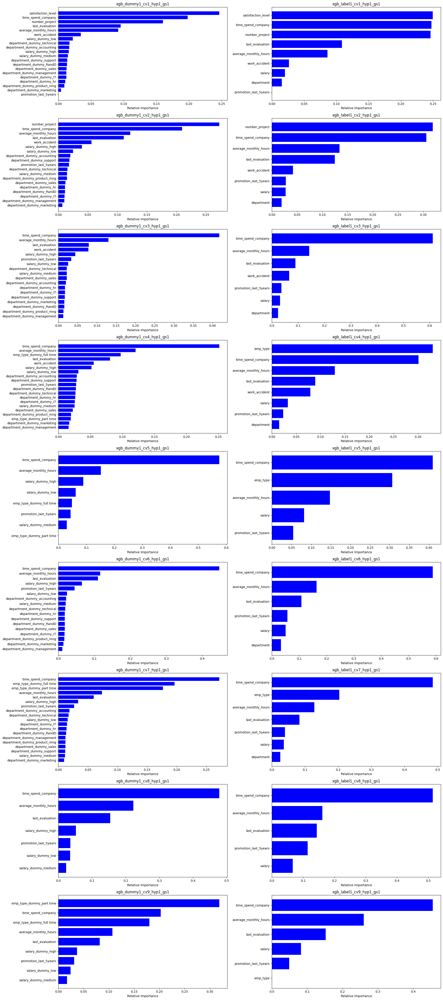

In [59]:
#############################################################
#Plot feature importance
#############################################################
import math

rowCount=math.ceil(len(xgb_cv_list)/2)
fig, axes = plt.subplots(nrows=rowCount, ncols=2, figsize=(20,rowCount*5))

for xgb_cv, ax, index in zip(xgb_cv_list, axes.flatten(), range(len(xgb_cv_list))):
    xgb_best=xgb_cv.best_estimator_
    importances = xgb_best.feature_importances_

    #pickle file xgb_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(xgb_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'xgb_dummy' in xgb_model_name_list[index]:
        features=get_fit_features(select_col,X_dummy_val.columns,'dummy')
    elif 'xgb_label' in xgb_model_name_list[index]:
        features=get_fit_features(select_col,X_label_val.columns,'label')

    indices = np.argsort(importances)
    # customized number
    if len(importances)>=20:
        num_features = 20
    else:
        num_features =len(importances)

    ax.set_title(xgb_model_name_list[index])
    # only plot the customized number of features
    ax.barh(range(num_features), importances[indices[-num_features:]], color='b', align='center')
    #ax.set_yticks(range(num_features),[features[i] for i in indices[-num_features:]])
    ax.set_xlabel('Relative Importance')
    ax.set_yticks(range(num_features))
    ax.set_yticklabels([features[i] for i in indices[-num_features:]])

plt.tight_layout()
plt.show()

#### Decision Tree

In [60]:
###################################################
#Copy pickles files to pickle folders
#Output folder will clear after session stop
#need to copy previous results
###################################################
import os
import glob
import shutil
 
source = '/kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/classcification/dt_pickle/'
destination = path_dt

# gather all files
allfiles = glob.glob(os.path.join(source, 'dt_*.pickle'), recursive=True)
#print("Files to copy", allfiles)
 
# iterate on all files to move them to destination folder
for file_path in allfiles:
    dst_path = os.path.join(destination, os.path.basename(file_path))
    shutil.copyfile(file_path, dst_path)
    print(f"Copied {file_path} -> {dst_path}")

Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/classcification/dt_pickle/dt_label1_cv9_hyp1_gs1.pickle -> /kaggle/working/dt_pickle/dt_label1_cv9_hyp1_gs1.pickle
Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/classcification/dt_pickle/dt_dummy1_cv9_hyp1_gs1.pickle -> /kaggle/working/dt_pickle/dt_dummy1_cv9_hyp1_gs1.pickle
Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/classcification/dt_pickle/dt_dummy1_cv8_hyp1_gs1.pickle -> /kaggle/working/dt_pickle/dt_dummy1_cv8_hyp1_gs1.pickle
Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/classcification/dt_pickle/dt_label1_cv4_hyp1_gs1.pickle -> /kaggle/working/dt_pickle/dt_label1_cv4_hyp1_gs1.pickle
Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/classcification/dt_pickle/dt_label1_cv3_hyp1_gs1.pickle -> /kaggle/working/dt_pickle/dt_label1_cv3_hyp1_gs1.pickle
Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/classcification/dt_pickle/dt_dummy1

In [61]:
dt = DecisionTreeClassifier(random_state = RANDOM_STATE)

dt_cv_dummy_params_list=[
    #index:1
    {'max_depth': [5,7,9,11], 
     'min_samples_leaf': [1],
     'min_samples_split': [2],
     'max_features': [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9,1],
     'class_weight':['balanced',None],
    },
    #index:2
    {'max_depth': [7,8,9,10], 
     'min_samples_leaf': [1,5,10],
     'min_samples_split': [2],
     'max_features': [0.2, 0.3, 0.4, 0.5, 0.7, 0.8, 0.9,1],
     'class_weight':['balanced',None],
    },
]

dt_cv_label_params_list=[
    #index:1
    {'max_depth': [5,7,9,11], 
     'min_samples_leaf': [1],
     'min_samples_split': [2],
     'max_features': [0.4, 0.5, 0.6, 0.7, 0.8, 0.9,1],
     'class_weight':['balanced',None],
    },
    #index:2
    {'max_depth': [7,8,9,10], 
     'min_samples_leaf': [1,5,10],
     'min_samples_split': [2],
     'max_features': [0.3, 0.5,0.7, 0.9,1],
     'class_weight':['balanced',None],
    },
]

In [62]:
def dt_grid_fit(target_index:int,feature_index:int, hyp_index:int, gs_index:int, encoding_type:str,dt_classifier, cv=5,refit='f1',score=['accuracy', 'precision', 'recall', 'f1']):
    """
        fit gridsearch
        Input:
            target_index(int): indexof target variable list, strat from 1
            feature_index(int): index of feature list, start from 1
            hyp_index(int): index of hyperparameters list, start from 1
            gs_index(int): grid search index if want to try different cv or refit, start from 1
            encoding_type(str): data encoding type. 'dummy' or 'label'
            dt_classifier(RandomForestClassifier):RandomForestClassifier
            cv(int):cross-validation generator or an iterable
            refit: Refit an estimator using the best found parameters on the whole dataset
    """
    if (target_index<1) | (feature_index<1) | (hyp_index<1)| (gs_index<1):
        raise Exception("Index start from 1")
    
    feature_len=len(select_col_list)
    target_len=len(depedent_variables)
    # check feature list index range
    if (feature_index > feature_len) | (target_index > target_len):
        raise Exception("feature_index out of range")
    
    chk_encoding_type(encoding_type)
    
    #get feature
    select_col=select_col_list[feature_index-1]
    #https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-callable
    #score=['accuracy', 'precision', 'recall', 'f1']
    pickle_path=path_dt
    pickle_filenm=f'dt_{encoding_type}{target_index}_cv{feature_index}_hyp{hyp_index}_gs{gs_index}'
    run_start_time = datetime.datetime.now()
    print(f'{run_start_time}: Fit Start')
    if encoding_type == 'label':
        #check hyperparameters index range
        label_hyp_len=len(cv_label_params_list)
        if hyp_index > label_hyp_len:
            raise Exception("hyp_index out of range")
        #get hypemeter
        hyp_params=dt_cv_label_params_list[hyp_index-1]
        #get X variables
        X_label_train=X_label_train_list[target_index-1]
        #get y variable
        y_label_train=y_label_train_list[target_index-1]
        #get feature name list
        select_feature=get_fit_features(select_col,X_label_train.columns,encoding_type)
        #Instantiate the GridSearchCV object
        dt_label_cv = GridSearchCV(dt_classifier, hyp_params, scoring=score, cv=cv, refit=refit,n_jobs=-1)
        #print(pd.isna(X_label_train[select_feature]).any(axis=0))
        dt_label_cv.fit(X_label_train[select_feature], y_label_train)
        write_pickle(pickle_path, dt_label_cv, pickle_filenm)
    elif encoding_type == 'dummy':
        #check hyperparameters index range
        dummy_hyp_len=len(cv_dummy_params_list)
        if hyp_index > dummy_hyp_len:
            raise Exception("hyp_index out of range")
        #get hypemeter
        hyp_params=dt_cv_dummy_params_list[hyp_index-1]
        #get X variables
        X_dummy_train=X_dummy_train_list[target_index-1]
        #get y variable
        y_dummy_train=y_dummy_train_list[target_index-1]
        #get feature name list
        select_feature=get_fit_features(select_col,X_dummy_train.columns,encoding_type)
        #Instantiate the GridSearchCV object
        dt_dummy_cv = GridSearchCV(dt_classifier, hyp_params, scoring=score, cv=cv, refit=refit,n_jobs=-1)
        #print(pd.isna(X_dummy_train[select_feature]).any(axis=0))
        dt_dummy_cv.fit(X_dummy_train[select_feature], y_dummy_train)
        write_pickle(pickle_path, dt_dummy_cv, pickle_filenm)
    else:
        raise Exception("Only 'dummy' or 'label' allowed")
    run_end_time = datetime.datetime.now()
    print('**************Fit parameters******************')
    print('select_col: ',select_col)
    print('select_feature: ',select_feature)
    print('hyp_params: ',hyp_params)
    print('encoding_type: ',encoding_type)
    print('cv: ',cv)
    print('refit: ',refit)
    print('pickle file name: ',pickle_filenm)
    print('**************Fit parameters******************')
    print(f'{run_end_time}: Fit End')
    print(f'Fit duration: {compute_run_duration(run_start_time,run_end_time)}')


def dt_read_pickle(target_index,feature_index, hyp_index, gs_index, encoding_type,path):
    dt_cv_list=[]
    dt_model_name_list=[]
    target_index_list=compute_index_list(target_index)
    feature_index_list=compute_index_list(feature_index)
    hyp_index_list=compute_index_list(hyp_index)
    gs_index_list=compute_index_list(gs_index)
    encoding_type_list=compute_encoding_list(encoding_type)
    for target_index in target_index_list:
        for feature_index in feature_index_list:
            for encoding_type in encoding_type_list:
                for hyp_index in hyp_index_list:
                    for gs_index in gs_index_list:
                        saved_model_name=f'dt_{encoding_type}{target_index}_cv{feature_index}_hyp{hyp_index}_gs{gs_index}'
                        if check_picklefile_exists(path, saved_model_name)==True:
                            print(saved_model_name)
                            dt=read_pickle(path, saved_model_name)
                            dt_model_name_list.append(saved_model_name)
                            dt_cv_list.append(dt)  
    return dt_cv_list,dt_model_name_list


In [63]:
%%script True
####################################################
#target_index:[1]
#feature_index:[1,2,3,4,5,6,7,8,9]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:5
####################################################
target_index_list=[1]
feature_index_list=[1,2,3,4,5,6,7,8,9]
#hyparameter index,start from 1
hyp_index_list=[1]

for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
                dt_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', dt_classifier=dt,cv=5, refit='f1')
                dt_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='dummy', dt_classifier=dt,cv=5, refit='f1')

Couldn't find program: 'True'


In [64]:
###################################################
#Read from pickle
###################################################
#feature_index=1
#hyp_index=1
#gs_index=1
target_len=len(depedent_variables)
feature_len=len(select_col_list)
#feature_len=1
hyp_len=max(len(dt_cv_label_params_list),len(dt_cv_dummy_params_list))
gs_len=5
encoding_type=['dummy','label']
dt_cv_list,dt_model_name_list=dt_read_pickle(target_len,feature_len, hyp_len, gs_len, encoding_type,path_dt)

dt_dummy1_cv1_hyp1_gs1
dt_label1_cv1_hyp1_gs1
dt_dummy1_cv2_hyp1_gs1
dt_label1_cv2_hyp1_gs1
dt_dummy1_cv3_hyp1_gs1
dt_label1_cv3_hyp1_gs1
dt_dummy1_cv4_hyp1_gs1
dt_label1_cv4_hyp1_gs1
dt_dummy1_cv5_hyp1_gs1
dt_label1_cv5_hyp1_gs1
dt_dummy1_cv6_hyp1_gs1
dt_label1_cv6_hyp1_gs1
dt_dummy1_cv7_hyp1_gs1
dt_label1_cv7_hyp1_gs1
dt_dummy1_cv8_hyp1_gs1
dt_label1_cv8_hyp1_gs1
dt_dummy1_cv9_hyp1_gs1
dt_label1_cv9_hyp1_gs1


In [65]:
###################################################
#Examine the best combination of hyperparameters.
###################################################
dt_best_hyperparameters=pd.DataFrame()
for index in range(len(dt_cv_list)):
    dt_row=dt_cv_list[index].best_params_
    dt_row['dt Model name']=dt_model_name_list[index]
    df_dictionary = pd.DataFrame([dt_row])
    dt_best_hyperparameters = pd.concat([dt_best_hyperparameters, df_dictionary], ignore_index=True)

dt_best_hyperparameters.to_csv('dt_best_hyperparameters.csv', index=False)
dt_best_hyperparameters

,class_weight,max_depth,max_features,min_samples_leaf,min_samples_split,dt Model name
0,None,7,0.7,1,2,dt_dummy1_cv1_hyp1_gs1
1,None,7,0.7,1,2,dt_label1_cv1_hyp1_gs1
2,None,7,0.9,1,2,dt_dummy1_cv2_hyp1_gs1
3,None,9,0.7,1,2,dt_label1_cv2_hyp1_gs1
4,None,9,0.8,1,2,dt_dummy1_cv3_hyp1_gs1
5,None,9,0.8,1,2,dt_label1_cv3_hyp1_gs1
6,None,9,0.9,1,2,dt_dummy1_cv4_hyp1_gs1
7,None,9,0.8,1,2,dt_label1_cv4_hyp1_gs1
8,balanced,9,0.8,1,2,dt_dummy1_cv5_hyp1_gs1
9,balanced,9,0.6,1,2,dt_label1_cv5_hyp1_gs1


In [66]:
###################################################
#Training Results
###################################################
dt_train_score_list=[]
for dt_cv, index in zip(dt_cv_list, range(len(dt_cv_list))):
    dt_best=dt_cv.best_estimator_
    #pickle file dt_[dummy|label]_cvXX_hyp*_gs* XX was index
    params_index=find_number(dt_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'dt_dummy' in dt_model_name_list[index]:
        target_index=find_number(dt_model_name_list[index], 'dt_dummy')[0]-1
        X_dummy_train=X_dummy_train_list[target_index]
        y_dummy_train=y_dummy_train_list[target_index]
        select_feature=get_fit_features(select_col,X_dummy_train.columns,'dummy')
        dt_preds=dt_best.predict(X_dummy_train[select_feature])
        dt_preds_proba=dt_best.predict_proba(X_dummy_train[select_feature])[:, 1]
        train_score=get_test_scores(dt_model_name_list[index], dt_preds, y_dummy_train,dt_preds_proba)
    elif 'dt_label' in dt_model_name_list[index]:
        target_index=find_number(dt_model_name_list[index], 'dt_label')[0]-1
        X_label_train=X_label_train_list[target_index]
        y_label_train=y_label_train_list[target_index]
        select_feature=get_fit_features(select_col,X_label_train.columns,'label')
        dt_preds=dt_best.predict(X_label_train[select_feature])
        dt_preds_proba=dt_best.predict_proba(X_label_train[select_feature])[:, 1]
        train_score=get_test_scores(dt_model_name_list[index], dt_preds, y_label_train,dt_preds_proba)
    
    dt_train_score_list.append(train_score)

dt_train_score=pd.concat(dt_train_score_list).reset_index(drop=True)
dt_train_score.to_csv('dt_train_score.csv', index=False)
dt_train_score

,model,precision,recall,F1,accuracy,ROC_AUC
0,dt_dummy1_cv1_hyp1_gs1,0.972198,0.937186,0.954371,0.985126,0.987159
1,dt_label1_cv1_hyp1_gs1,0.982379,0.933836,0.957492,0.986239,0.990579
2,dt_dummy1_cv2_hyp1_gs1,0.901374,0.933836,0.917318,0.972060,0.983561
3,dt_label1_cv2_hyp1_gs1,0.941870,0.936348,0.939101,0.979844,0.990055
4,dt_dummy1_cv3_hyp1_gs1,0.807122,0.911223,0.856019,0.949124,0.979887
5,dt_label1_cv3_hyp1_gs1,0.817378,0.929648,0.869906,0.953850,0.985197
6,dt_dummy1_cv4_hyp1_gs1,0.798295,0.941374,0.863951,0.950792,0.980638
7,dt_label1_cv4_hyp1_gs1,0.800434,0.927136,0.859139,0.949541,0.981994
8,dt_dummy1_cv5_hyp1_gs1,0.550000,0.958124,0.698839,0.862941,0.944736
9,dt_label1_cv5_hyp1_gs1,0.549688,0.958961,0.698810,0.862802,0.942983


In [67]:
###################################################
#Validation Results
###################################################
dt_val_score_list=[]
for dt_cv, index in zip(dt_cv_list, range(len(dt_cv_list))):
    dt_best=dt_cv.best_estimator_
    
    #pickle file dt_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(dt_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'dt_dummy' in dt_model_name_list[index]:
        target_index=find_number(dt_model_name_list[index], 'dt_dummy')[0]-1
        X_dummy_val=X_dummy_val_list[target_index]
        y_dummy_val=y_dummy_val_list[target_index]
        select_feature=get_fit_features(select_col,X_dummy_val.columns,'dummy')
        dt_preds=dt_best.predict(X_dummy_val[select_feature])
        dt_preds_proba=dt_best.predict_proba(X_dummy_val[select_feature])[:, 1]
        val_score=get_test_scores(dt_model_name_list[index], dt_preds, y_dummy_val,dt_preds_proba)
        
    elif 'dt_label' in dt_model_name_list[index]:
        target_index=find_number(dt_model_name_list[index], 'dt_label')[0]-1
        X_label_val=X_label_val_list[target_index]
        y_label_val=y_label_val_list[target_index]
        select_feature=get_fit_features(select_col,X_label_val.columns,'label')
        dt_preds=dt_best.predict(X_label_val[select_feature])
        dt_preds_proba=dt_best.predict_proba(X_label_val[select_feature])[:, 1]
        val_score=get_test_scores(dt_model_name_list[index], dt_preds, y_label_val,dt_preds_proba)
    
    dt_val_score_list.append(val_score)

dt_val_score=pd.concat(dt_val_score_list).reset_index(drop=True)
dt_val_score.to_csv('dt_val_score.csv', index=False)
dt_val_score

,model,precision,recall,F1,accuracy,ROC_AUC
0,dt_dummy1_cv1_hyp1_gs1,0.967273,0.889632,0.926829,0.976654,0.958701
1,dt_label1_cv1_hyp1_gs1,0.970480,0.879599,0.922807,0.975542,0.954431
2,dt_dummy1_cv2_hyp1_gs1,0.857627,0.846154,0.851852,0.951084,0.923104
3,dt_label1_cv2_hyp1_gs1,0.937500,0.852843,0.893170,0.966092,0.900946
4,dt_dummy1_cv3_hyp1_gs1,0.779874,0.829431,0.803890,0.932740,0.932226
5,dt_label1_cv3_hyp1_gs1,0.784615,0.852843,0.817308,0.936631,0.920460
6,dt_dummy1_cv4_hyp1_gs1,0.760234,0.869565,0.811232,0.932740,0.928906
7,dt_label1_cv4_hyp1_gs1,0.761062,0.862876,0.808777,0.932185,0.927496
8,dt_dummy1_cv5_hyp1_gs1,0.514231,0.906355,0.656174,0.842135,0.906637
9,dt_label1_cv5_hyp1_gs1,0.516190,0.906355,0.657767,0.843246,0.903955


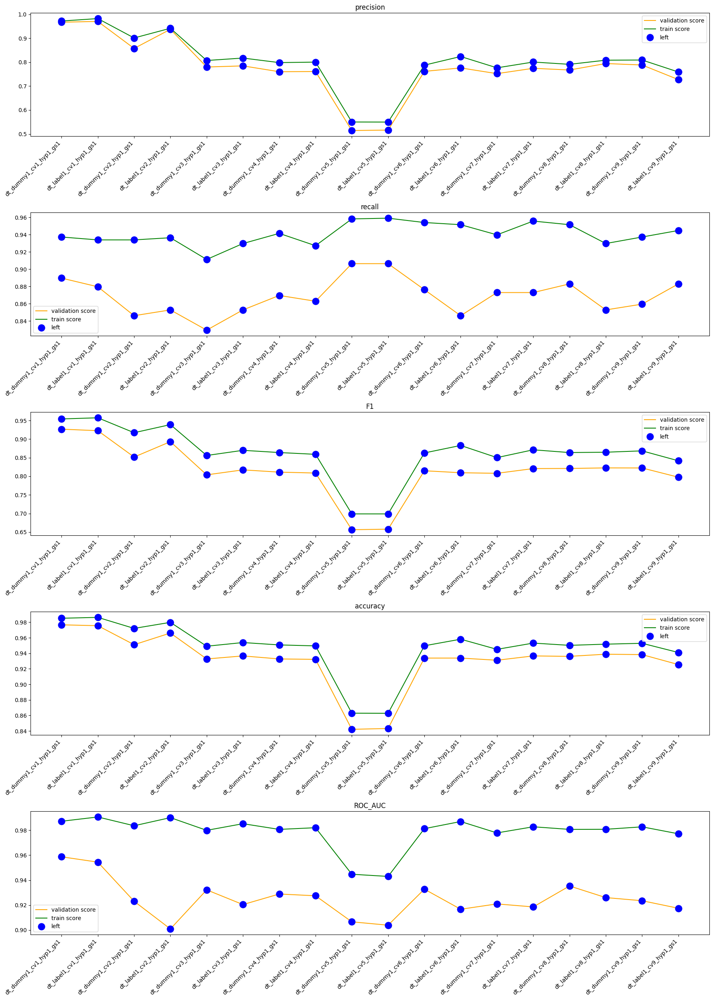

In [68]:
##############################################
#Show Validation Results
##############################################
fig, axs = plt.subplots(5, 1, figsize=(18,25))

metrics=['precision','recall', 'F1','accuracy','ROC_AUC']

#plot validation scores
for metric, ax in zip(metrics, axs.ravel()):
    ax.plot(dt_val_score['model'], dt_val_score[metric], color='orange', label='validation score')
    ax.plot(dt_train_score['model'], dt_train_score[metric], color='green', label='train score')
    
    #add marker to target variables
    substr_list=[
        #left
        '_dummy1_|_label1_',
    ]
    marker_list=['bo']
    markersize_list=[12]
    for substr,unit_marker, unit_marker_size, unit_index in zip(substr_list,marker_list,markersize_list,range(1,len(substr_list)+1)):
        ax.plot(dt_val_score[dt_val_score['model'].str.contains(substr)]['model'], dt_val_score[dt_val_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size,label=f"{depedent_variables[unit_index-1]}")
        ax.plot(dt_train_score[dt_train_score['model'].str.contains(substr)]['model'], dt_train_score[dt_train_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size)

    ax.set_title(metric)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    #ax.tick_params(labelrotation=90)
    ax.legend()

plt.tight_layout()
plt.show()

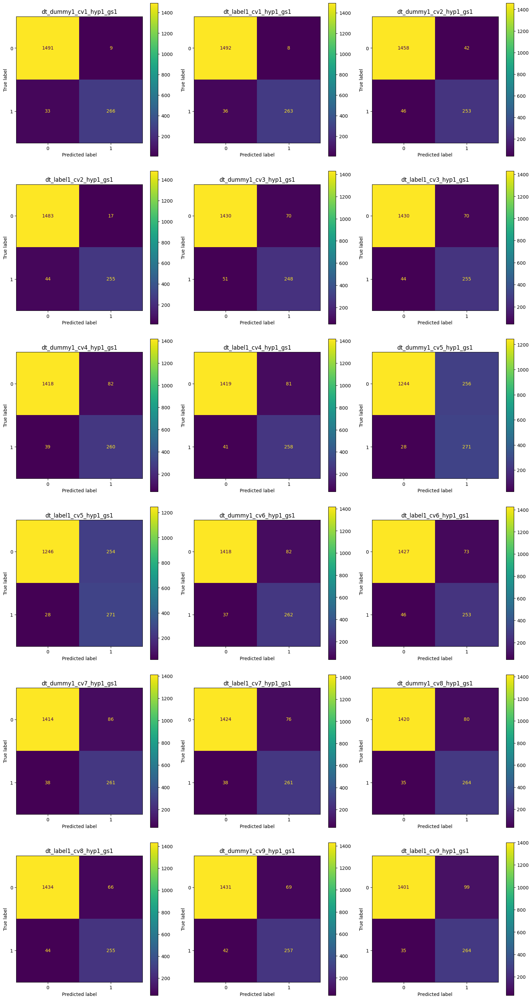

In [69]:
#################################################################################
##Display confusion matrix on validation data
#################################################################################
rowCount=math.ceil(len(dt_cv_list)/3)
fig, axes = plt.subplots(nrows=rowCount, ncols=3, figsize=(16,rowCount*5))

for dt_cv, ax, index in zip(dt_cv_list, axes.flatten(), range(len(dt_cv_list))):
    dt_best=dt_cv.best_estimator_
    
    #pickle file dt_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(dt_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'dt_dummy' in dt_model_name_list[index]:
        target_index=find_number(dt_model_name_list[index], 'dt_dummy')[0]-1
        X_dummy_val=X_dummy_val_list[target_index]
        y_dummy_val=y_dummy_val_list[target_index]
        select_feature=get_fit_features(select_col,X_dummy_val.columns,'dummy')
        confusion_matrix_plot_ax(dt_cv, 
                              X_dummy_val[select_feature], 
                              y_dummy_val, 
                              ax=ax, 
                              title=dt_model_name_list[index])
        
    elif 'dt_label' in dt_model_name_list[index]:
        target_index=find_number(dt_model_name_list[index], 'dt_label')[0]-1
        X_label_val=X_label_val_list[target_index]
        y_label_val=y_label_val_list[target_index]
        select_feature=get_fit_features(select_col,X_label_val.columns,'label')
        confusion_matrix_plot_ax(dt_cv, 
                              X_label_val[select_feature],
                              y_label_val, 
                              ax=ax, 
                              title=dt_model_name_list[index])

plt.tight_layout()
plt.show()

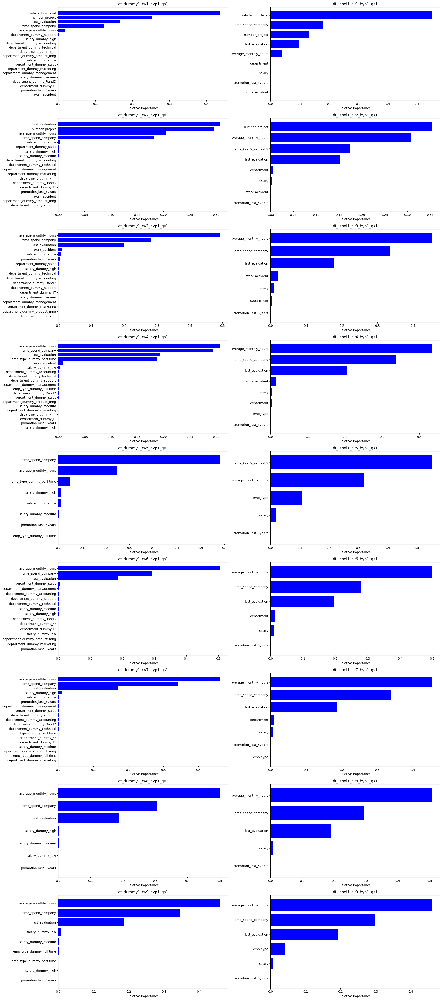

In [70]:
#############################################################
#Plot feature importance
#############################################################
import math

rowCount=math.ceil(len(dt_cv_list)/2)
fig, axes = plt.subplots(nrows=rowCount, ncols=2, figsize=(20,rowCount*5))

for dt_cv, ax, index in zip(dt_cv_list, axes.flatten(), range(len(dt_cv_list))):
    dt_best=dt_cv.best_estimator_
    importances = dt_best.feature_importances_

    #pickle file dt_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(dt_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'dt_dummy' in dt_model_name_list[index]:
        features=get_fit_features(select_col,X_dummy_val.columns,'dummy')
    elif 'dt_label' in dt_model_name_list[index]:
        features=get_fit_features(select_col,X_label_val.columns,'label')

    indices = np.argsort(importances)
    # customized number
    if len(importances)>=20:
        num_features = 20
    else:
        num_features =len(importances)

    ax.set_title(dt_model_name_list[index])
    # only plot the customized number of features
    ax.barh(range(num_features), importances[indices[-num_features:]], color='b', align='center')
    #ax.set_yticks(range(num_features),[features[i] for i in indices[-num_features:]])
    ax.set_xlabel('Relative Importance')
    ax.set_yticks(range(num_features))
    ax.set_yticklabels([features[i] for i in indices[-num_features:]])

plt.tight_layout()
plt.show()

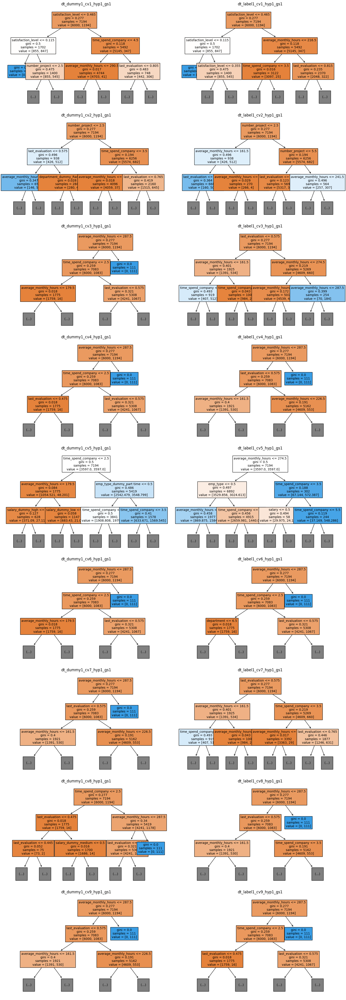

In [71]:
#############################################################
#Plot the "best" decision tree
#############################################################
rowCount=math.ceil(len(dt_cv_list)/2)
fig, axes = plt.subplots(nrows=rowCount, ncols=2, figsize=(16,rowCount*5))
for dt_cv, ax, index in zip(dt_cv_list, axes.flatten(), range(len(dt_cv_list))):
    best_tree=dt_cv.best_estimator_
    
    #pickle file dt_[dummy|label][1|2]_cvXX XX was index
    params_index=find_number(dt_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()
    if 'dt_dummy' in dt_model_name_list[index]:
        #0:generous,1:not_generous
        target_variable_cnt=find_number(dt_model_name_list[index], 'dt_dummy')[0]-1
        X_dummy_val=X_dummy_val_list[target_variable_cnt]
        
        select_feature=get_fit_features(select_col,X_dummy_val.columns,'dummy')
        
        plot_tree(best_tree, max_depth=2, fontsize=10, feature_names=select_feature, 
          filled=True, ax=ax)
    elif 'dt_label' in dt_model_name_list[index]:
        #0:generous,1:not_generous
        target_variable_cnt=find_number(dt_model_name_list[index], 'dt_label')[0]-1
        X_label_val=X_label_val_list[target_variable_cnt]
        
        select_feature=get_fit_features(select_col,X_label_val.columns,'label')
        
        plot_tree(best_tree, max_depth=2, fontsize=10, feature_names=select_feature, 
          filled=True, ax=ax)
    ax.set_title(dt_model_name_list[index])
        
plt.tight_layout()
plt.show()

#### Compare score on all models

In [72]:
#Merge all train results
allmodel_train_score=pd.concat([rf_train_score,xgb_train_score,dt_train_score]).reset_index(drop=True)

#Merge all validation results
allmodel_val_score=pd.concat([rf_val_score,xgb_val_score,dt_val_score]).reset_index(drop=True)

#allmodel_val_score.to_csv('allmodel_val_score.csv', index=False)
display(allmodel_train_score.head())
display(allmodel_val_score.head())

,model,precision,recall,F1,accuracy,ROC_AUC
0,rf_dummy1_cv1_hyp1_gs1,0.989409,0.938861,0.963472,0.988185,0.999775
1,rf_label1_cv1_hyp1_gs1,0.990376,0.948074,0.968763,0.989853,0.999771
2,rf_dummy1_cv2_hyp1_gs1,0.956155,0.949749,0.952941,0.984431,0.998576
3,rf_label1_cv2_hyp1_gs1,0.953311,0.940536,0.946880,0.982485,0.998395
4,rf_dummy1_cv3_hyp1_gs1,0.821178,0.980737,0.893893,0.961357,0.990092


,model,precision,recall,F1,accuracy,ROC_AUC
0,rf_dummy1_cv1_hyp1_gs1,0.996183,0.872910,0.930481,0.978321,0.971246
1,rf_label1_cv1_hyp1_gs1,0.996169,0.869565,0.928571,0.977765,0.970187
2,rf_dummy1_cv2_hyp1_gs1,0.966543,0.869565,0.915493,0.973319,0.955489
3,rf_label1_cv2_hyp1_gs1,0.955720,0.866221,0.908772,0.971095,0.960522
4,rf_dummy1_cv3_hyp1_gs1,0.795732,0.872910,0.832536,0.941634,0.946708


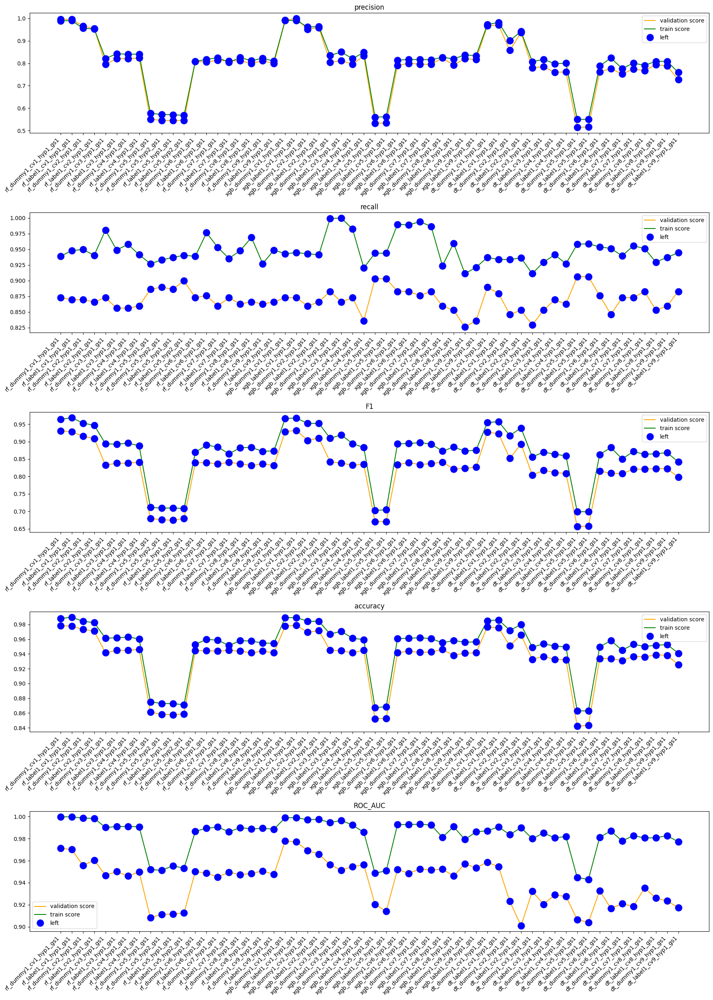

In [73]:
##############################################
#Show Validation Results
##############################################
fig, axs = plt.subplots(5, 1, figsize=(18,25))

metrics=['precision','recall', 'F1','accuracy','ROC_AUC']

#plot validation scores
for metric, ax in zip(metrics, axs.ravel()):
    ax.plot(allmodel_val_score['model'], allmodel_val_score[metric], color='orange', label='validation score')
    ax.plot(allmodel_train_score['model'], allmodel_train_score[metric], color='green', label='train score')
    
    #add marker to target variables
    substr_list=[
        #left
        '_dummy1_|_label1_',
    ]
    marker_list=['bo']
    markersize_list=[12]
    for substr,unit_marker, unit_marker_size, unit_index in zip(substr_list,marker_list,markersize_list,range(1,len(substr_list)+1)):
        ax.plot(allmodel_val_score[allmodel_val_score['model'].str.contains(substr)]['model'], allmodel_val_score[allmodel_val_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size,label=f"{depedent_variables[unit_index-1]}")
        ax.plot(allmodel_train_score[allmodel_train_score['model'].str.contains(substr)]['model'], allmodel_train_score[allmodel_train_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size)

    ax.set_title(metric)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    #ax.tick_params(labelrotation=90)
    ax.legend()

plt.tight_layout()
plt.show()

### Fit model with train and validation set

* Select a champion model
* Fit champion model with train and validation set
* Evaluate champion model on test set

In [74]:
#########################################################
#Best model
#Consider tip_amount calculation difference
#this type will choose random forest 
#########################################################
#get best params
best_model_index=rf_model_name_list.index('rf_dummy1_cv8_hyp1_gs1')
best_rf=rf_cv_list[best_model_index]
best_params=best_rf.best_params_
#remove randomforestclassifier__ in resampled model
best_params = {k.replace('randomforestclassifier__',''):v for k,v in best_params.items()}

best_model_name=rf_model_name_list[best_model_index]
#pickle file rf_[dummy|label]xx_cvXX_hyp*_gs* XX is index
params_index=find_number(best_model_name, '_cv')[0]-1
select_col=select_col_list[params_index].copy()
print(f"best hyperpatameters: {best_params}")
print(f"best features: {select_col}")
print(f"best model name: {best_model_name}")

###################################################
#Fit model and get test score
###################################################
if 'RF Model name' in best_params:
        best_params.pop('RF Model name')
rf_classifier_best = RandomForestClassifier(**best_params,
                                          random_state=RANDOM_STATE)
if 'rf_dummy' in best_model_name:
    target_index=find_number(best_model_name, 'rf_dummy')[0]-1
    X_dummy_train_val=X_dummy_train_val_list[target_index]
    y_dummy_train_val=y_dummy_train_val_list[target_index]
    select_feature=get_fit_features(select_col,X_dummy_train_val.columns,'dummy')
    # Fiting the model to the training data using the best parameters
    rf_classifier_best.fit(X_dummy_train_val[select_feature], y_dummy_train_val)

    #get test score
    X_dummy_test=X_dummy_test_list[target_index]
    y_dummy_test=y_dummy_test_list[target_index]
    rf_preds=rf_classifier_best.predict(X_dummy_test[select_feature])
    rf_preds_proba=rf_classifier_best.predict_proba(X_dummy_test[select_feature])[:, 1]
    test_score=get_test_scores(best_model_name, rf_preds, y_dummy_test,rf_preds_proba)
        
elif 'rf_label' in best_model_name:
    target_index=find_number(best_model_name, 'rf_label')[0]-1
    X_label_train_val=X_label_train_val_list[target_index]
    y_label_train_val=y_label_train_val_list[target_index]
    select_feature=get_fit_features(select_col,X_label_train_val.columns,'label')
    rf_classifier_best.fit(X_label_train_val[select_feature], y_label_train_val)
    
    #get test score
    X_label_test=X_label_test_list[target_index]
    y_label_test=y_label_test_list[target_index]
    rf_preds=rf_classifier_best.predict(X_label_test[select_feature])
    rf_preds_proba=rf_classifier_best.predict_proba(X_label_test[select_feature])[:, 1]
    test_score=get_test_scores(best_model_name, rf_preds, y_label_test,rf_preds_proba)

rf_test_score=pd.concat([test_score]).reset_index(drop=True)
rf_test_score.to_csv('rf_test_score.csv', index=False, mode='w')
rf_test_score

best hyperpatameters: {'class_weight': None, 'max_depth': 11, 'max_features': 0.6, 'max_samples': 0.9, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 80, 'RF Model name': 'rf_dummy1_cv8_hyp1_gs1'}
best features: ['last_evaluation', 'average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'salary']
best model name: rf_dummy1_cv8_hyp1_gs1


,model,precision,recall,F1,accuracy,ROC_AUC
0,rf_dummy1_cv8_hyp1_gs1,0.789474,0.903614,0.842697,0.943963,0.953627


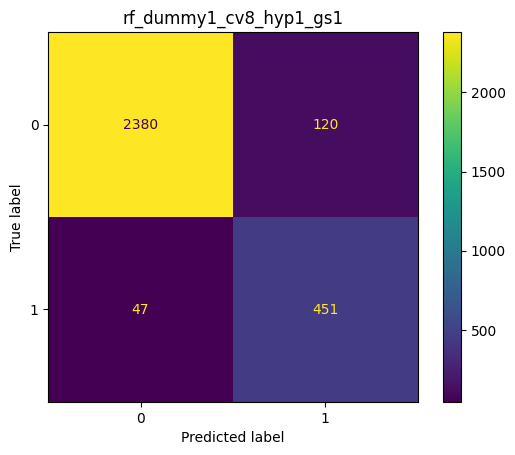

In [75]:
################################################
#Display confusion matrix of champion model
################################################
confusion_matrix_plot(best_rf, 
                      X_dummy_test[select_feature], 
                      y_dummy_test, 
                      title=best_model_name)

### Questions of Sharing

>What key insights emerged from your model(s)?

* When use all left employees to predict,  average_monthly_hour,time_spend_company and last_evaluation were very important factors
* When use employees who quit their job to predict(Assume employees who didn't belonged to the three groups were employees who choose to quit their job), average_monthly_hours, salary, time_spend_company and last_evaluation were very important factors
* Employees left company had higher average_monthly_hours than employees who didn't, it might indicate overtime work, poor work life balance would make employees quit their job
* Employees left company had higher last_evaluation than employees who didn't, it might indicate no opportunity for growth or development, not satisfacied salary or other reasons
* Employees had lower salary tend to have higher left ratio, it might indicate not satisfacied salary

>What business recommendations do you propose based on the models built?

* Collect/Monitor employees' work hours to see if has any patterns. (e.g. almost equal work hour every month, certain month/season were high, change a lot no pattern)
    * if equal work hour every month and work hour were in a high level, it might indicate workload and resources were unbalance or overtime culture or other reasons, need further investigatation.
    * if it has seasonal pattern, it might indicate they have some seasonal work or workload rely on season or resources rely on season, need further investigatation.
    * if it change a lot, there are many posibilities need further investigatation.
* Confirm reason(Why long time work) 
* Take action to reduce long time work

|Reason             |Action                                                               |
|:-                 |:-                                                                   |
|Heavy workload     |Distribute part of work to others<BR/>Automation<BR/>Match staffing to demand, etc.<BR/>|
|Improperly scheduled|Record project detail(process,step), member time in department/team,personnel fee, actual time, quality of results<BR/>Set schedule based on historical data |
|Frequent changes|Define each step output<BR/>Define/Improve workflow<BR/>Define/Improve change process|
|Lack of skill|Educate and train employees|
|Overtime culture  |Leader group change mindset<BR/>Add overtime management to department kpi<BR/>Establish an official overtime policy<BR/>Track and analyze worktime regularly, etc.|

* Conduct Exit interviews to further analyze why does employee leave
* Conduct one on one meeting to understand their concerns, what they want to improve ,etc and give them necessary help/support
* (If possible) conduct a satisfaction survey regularly to further analyze which factors make them dissatisfied
* Provide education/training programs to employees
* Provide job redesign program or job rotation program to help employees to develop career

>What potential recommendations would you make to your manager/company?

* Different departments seem to have different promotion ratio, management had the highest ratio. It might indicate no career path for non management employees. We could consider introducing [Dual career ladders](https://www.talentalign.com/wp-content/uploads/2020/03/Dual-Career-Path-2.png) to build different promotion paths for different employees.


>Do you think your model could be improved? Why or why not? How?

Might could be improved or might could not be improved, it may just fit the validation/test set.

>Given what you know about the data and the models you were using, what other questions could you address for the team?

* This dataset may not be representative. Some typical departments(e.g. Quality, Supply Chain and Logistics, etc) in the automotive industry are not in this dataset.
* This dataset may not randomly sampled, there are patterns amoung average_monthly_hours, last_evaluation, satisfaction_level, number_project, time_spend_company. 
* There are 4 groups in this dataset. Group1-group3 might be company let them go, group4 might be quit. Group1-group3 are 1800, group4 is 191.
    * Group1: low-middle average_monthly_hours, low-middle last_evaluation, low-middle satisfaction_level,number_project=2, time_spend_company=3
    * Group2: high average_monthly_hours, high last_evaluation, low satisfaction_level,number_project=5,6,7, time_spend_company=4,5
    * Group3: high average_monthly_hours, high last_evaluation, high satisfaction_level,number_project=4,5, time_spend_company=5,6
    * Group4: randomly spread
* Amoung group4 we still could observe left employees had higher last_evaluation, it might indicate our company lack of chance to support high performers to build their career path or layoffs of employees had negative impact.
* Layoffs could be a way to help our company to achieve a goal, but should not be the only and first step.
* When layoff is necessary, address any tough questions and emotional reactions, explain the criteria used to make the decision, provide the employee with necessary resources, offer outplacement.


>What resources do you find yourself using as you complete this stage? (Make sure to include the links.)

* [9 Easy Ways To Reduce Your Employee’s Overtime](https://wheniwork.com/blog/how-to-reduce-overtime)
    * Treat overtime as the exception, not the rule
    * Make sure your team has the right equipment and resources
    * Track and identify overtime patterns
    * Cross-train your employees
    * Try flexible work schedules to reduce overtime
    * Cap overtime
    * Match staffing to demand
    * Establish an official overtime policy
    * Use employee scheduling software

* [I’m Outta Here Too: Study Finds Layoffs, Employee Departures Influence Co-Workers](https://www.carriermanagement.com/news/2023/05/16/248321.htm)
    * A recent study from UBC Sauder School of Business suggests that the departure of an employee, whether they quit or get fired, can cause many of their colleagues to follow suit and leave the company.

* [Signs You Will Be Laid Off](https://www.pegstaff.com/signs-you-will-be-laid-off/)
* [Meta Layoffs: Even Top Performers Got the Axe](https://english.scenarieconomici.it/international/meta-layoffs-even-top-performers-got-the-axe/)
* [How to Lay Off Employees](https://www.intoo.com/us/blog/how-to-lay-off-employees-script-what-to-say/)
    * Prepare for the notification meeting
    * Provide the employee with necessary resources
    * Address any tough questions and emotional reactions
    * Avoid making empty promises
    * Explain the criteria used to make the decision
    * Offer outplacement 
    * Be mindful of timing

* [Developing Employee Career Paths and Ladders](https://www.shrm.org/topics-tools/tools/toolkits/developing-employee-career-paths-ladders)

>Do you have any ethical considerations in this stage?

* Not representative dataset, may have bias.
* This dataset includes both employees who choose to quit their job and employees who are let go, if my assumption of how to distinguish employees who choose to quit is wrong, the model will have bias.
* When my model predicts someone will leave but they actually won’t leave, the company and department may take time/cost to prevent them from leaving(it depends on what kind of measures the company will take), in some cases the employees might lose chance to challenge important projects/promotion since their manager or leader think they might leave. When my model predicts someone won’t leave but they actual will leave, we will fail to prevent them from leaving, need to hire new employees, train them.


## Results and Evaluation
- Interpret model
- Evaluate model performance using metrics
- Prepare results, visualizations, and actionable steps to share with stakeholders


### Summary of model results

* When predict employees who will leave include quit and company let them go, average_monthly_hours, time_spend_company and last_evaluation were very important factors.
    * Jupyter notebook: `salifort-motors-employee-leave-prediction-models.ipynb`(this lab)
    * Champion model is `rf_dummy1_cv8_hyp1_gs1`, use `last_evaluation`, `average_monthly_hours`, `time_spend_company`, `promotion_last_5years`, `salary`.
    * On test dataset, amoung employees who are predicted to leave, 78.9% of them are actually left, amoung employees who are actually left, 90% of them are predicted to leave.
    * Champion model score
    
|Score	|precision	|recall	    |F1	        |accuracy	|ROC_AUC |
|:-     |:-         |:-         |:-         |:-         |:-      |
|Train  |0.825675	|0.948074	|0.882651	|0.958160	|0.989949|
|Val    |0.811321	|0.862876	|0.836305	|0.943858	|0.947352|
|Test	|0.789474	|0.903614	|0.842697	|0.943963	|0.953627|

* When predict employees who will quit (Assume employees who didn't belong to the three groups were employees who choose to quit their job), time_spend_company, average_monthly_hours, salary and last_evaluation were very important factors
    * Jupyter notebook: `salifort-motors-employee-personal-leave-prediction.ipynb`
    * Champion model is `xgb_label2_cv10_hyp2_gs3`, use `last_evaluation`, `average_monthly_hours`, `time_spend_company`, `promotion_last_5years`, `salary`
    * On test dataset, amoung employees who are predicted to leave, 9.3% of them are actually left, amoung employees who are actually left, 22.9% of them are predicted to leave. The performance of this model is not good, not recommend to use.
    * Champion model score

|Score	|precision	|recall	    |F1	        |accuracy	|ROC_AUC |
|:-     |:-         |:-         |:-         |:-         |:-      |
|Train  |0.228916	|0.500000	|0.314050	|0.965388	|0.934529|
|Val    |0.102941	|0.241379	|0.144330	|0.953863	|0.727508|
|Test	|0.09322	|0.229167	|0.13253	|0.951968	|0.657758|


* When predict employee satisfaction level, number_project, average_monthly_hours, time_spend_company,  last_evaluation and time_spend_company were very important factors.
    * Jupyter notebook: `salifortmotors-employee-satisfaction-prediction.ipynb`
    * Champion model is `rf_label3_cv10_hyp1_gs1`, use `last_evaluation`, `average_monthly_hours`, `time_spend_company`, `promotion_last_5years`, `salary`
    * On test dataset, 27% of satisfaction level could be explained by this model, mean squared error is 0.04.
    * Champion model score 

|Score	|R-squared	|Adjusted R-squared	|MSE	    |MAE        |AIC|BIC|
|:-     |:-         |:-         |:-         |:-         |:- |:- |
|Train  |0.401014	|0.400681|0.035196	|0.149014   |-3651.452896|-3617.047883|
|Val    |0.318733	|0.317214|0.038174	|0.155170   |-759.492748|-732.017817|
|Test	|0.272423	|0.27145|0.042053	|0.160774   |-982.161804|-952.1333|

    

### Conclusion, Recommendations, Next Steps



**Challenges and Problems**
* Some typical departments like Manufacturing, Packaging, Qulity control, Supply Chain and Logistics are not in this dataset, this dataset may not be representative
* Clear patterns appeared in this dataset. It might indicate data fraud or not randomly sampled data or not independent data(e.g. share survey results with other employees).
![Patterns](../image/tableau_dash_patterns.png)
* Lack of data. Could not distinguish employees who quit their job from employees company let them go

**Conclusion**
* Based on the dataset, `average_monthly_hours`, `time_spend_company` and `last_evaluation` are associated with employee satisfaction. 
* Benifit: This model could help us know who will leave and take measures to prevent them from leaving
* Limitation: This model could predict employees who will leave for personal and **company** reason. If our company has different evaluation, worktime, promotion policy or the policy change a lot, the result may not be robust.
* Employees left company had higher average_monthly_hours than employees who didn't, it might indicate overtime work, poor work life balance would make employees quit their job
* Employees left company had higher last_evaluation than employees who didn't, it might indicate no opportunity for growth or development, not satisfacied salary or other reasons
* Left ratio of employees who worked for 2-5 years tend to increase as time_spend_company increase, it might associated with carrer path/skill development
* Recommendations & Next step:
    * Confirm population information(e.g. total regions, departments, time in company, etc) with HR(In real projects it would be performed in an earlier stage)
    * Confirm survey collection process and survey data manipulation process with HR(In real projects it would be performed in an earlier stage)
    * If this dataset is not representative or independent, take a representative random independent sample and collect more data(e.g. Employment type, region, type of left, etc) to analyze.
    * If this dataset is representative and random independent samples:
        * Collect/Monitor employees' work hours to see if it has any patterns. (e.g. almost equal work hour every month, certain month/season were high, change a lot no pattern)
        * Conduct Exit interviews to further analyze
        * Conduct one on one meeting to understand their concerns, what they want to improve ,etc and give them necessary help/support
        * Conduct a satisfaction survey regularly to further analyze which factors make them dissatisfied (e.g. workload, environment, relationships, etc)
        * Consider providing education/training programs to employees
        * Consider providing job redesign program or job rotation program to help employees to develop career
        * Consider introducing Dual career ladders to build different promotion paths for different employees